# simple synthetic inversion

Here we try to recover the true Layer 1 topography with a gravity inversion. We start with the forward gravity of Layer 1 as the observed gravity, then down-sample this gravity to represent a coarser gravity survey, and final, repeate these steps with a regional component including in the observed gravity. The regional component is the forward gravity of Layer 2. 

We also explore adding gaussian noise to these gravity data. 

The starting (low-resolution) Layer 1 topography has been created through the random sampling and gridding of 30 points. In an Antarctic setting, these points represent single seismic survey locations which measure the elevation of Layer 1. 

import packages

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz

import sys

from RIS_gravity_inversion import plotting, optimization, synthetic, regional
import RIS_gravity_inversion.inversion as inv
import RIS_gravity_inversion.utils as inv_utils

import copy
from antarctic_plots import utils, regions, maps, fetch, profile
import zarr
import harmonica as hm
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import verde as vd
import scipy as sp
import pvxarray
import rioxarray
import pygmt
import plotly.graph_objects as go
import optuna
from optuna.storages import JournalStorage, JournalFileStorage
import warnings
import os
import pathlib
import string
import itertools
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import pickle
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from tqdm.contrib.itertools import product
from tqdm.autonotebook import tqdm

sns.set_theme()

# Load data

## topographic layers
* 2 full resolution synthetic layers
* low resolution layer 2

In [2]:
layer1 = xr.open_zarr("../synthetic_data/synthetic_layer1.zarr").z

layer2 = xr.open_zarr("../synthetic_data/synthetic_layer2.zarr").z

starting_layer1 = xr.open_zarr("../synthetic_data/synthetic_lowres_layer1.zarr").z

# ensure all xarray are same data type
layer1 = layer1.astype(np.float64)
layer2 = layer2.astype(np.float64)
starting_layer1 = starting_layer1.astype(np.float64)

print(utils.get_grid_info(layer1))
print(utils.get_grid_info(layer2))
print(utils.get_grid_info(starting_layer1))
starting_layer1

/home/tankerma/miniconda/envs/RIS_gravity_inversion/lib/python3.10/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


(1000.0, [-6000.0, 86000.0, -6000.0, 66000.0], -952.152099609, -481.448486328, 'g')
(1000.0, [-6000.0, 86000.0, -6000.0, 66000.0], -4689.66455078, -3614.13256836, 'g')
(1000.0, [-6000.0, 86000.0, -6000.0, 66000.0], -950.269714355, -378.920135498, 'g')


<xarray.DataArray 'z' (northing: 73, easting: 93)>
dask.array<open_dataset-b12505c8d6cfcd1d9cc0d5ec8b78f52ez, shape=(73, 93), dtype=float64, chunksize=(73, 93), chunktype=numpy.ndarray>
Coordinates:
  * easting   (easting) float64 -6e+03 -5e+03 -4e+03 ... 8.4e+04 8.5e+04 8.6e+04
  * northing  (northing) float64 -6e+03 -5e+03 -4e+03 ... 6.5e+04 6.6e+04
Attributes:
    metadata:  Generated by Spline()

## gravity data
* full resolution forward gravity of Layer 1
* full resolution with regional component
* sampled forward gravity of Layer 1
* sampled with regional component

In [3]:
# full resolution gravity point data
grav = pd.read_csv(
    "../synthetic_data/synthetic_simple_full_res_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
print(len(grav[grav.test]))
print(len(grav[grav.test == False]))
grav

14540
4941


,northing,easting,Surface1,Surface2,forward_total,test,upward
0,0.0,0.0,4.895946,-1.585934,3.310012,False,1000.0
1,0.0,500.0,4.832540,-1.641775,3.190765,True,1000.0
2,0.0,1000.0,4.764286,-1.697236,3.067050,False,1000.0
3,0.0,1500.0,4.692135,-1.752310,2.939826,True,1000.0
4,0.0,2000.0,4.616825,-1.806994,2.809832,False,1000.0
...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,9.220126,False,1000.0
19477,60000.0,78500.0,0.821796,8.327652,9.149448,True,1000.0
19478,60000.0,79000.0,0.821311,8.246703,9.068014,False,1000.0
19479,60000.0,79500.0,0.820943,8.153546,8.974489,True,1000.0


# Set region and parameters

Use the same regions and parameters as `synthetic_model_2layer.ipynb`

In [4]:
layer_spacing, buffer_region, _, _, registration = utils.get_grid_info(layer2)

# set gravity observation parameters
grav_observation_height = 1e3
grav_spacing = 1e3
sampled_grav_spacing = 2e3

inversion_region = utils.alter_region(
    buffer_region,
    zoom=6e3,
)[0]

# set density contrast
density = 2300 - 1024

print(f"spacing: {layer_spacing}m")
print(f"registration: {registration}")
print("inversion region = ", inversion_region)
print("buffer region = ", buffer_region)

spacing: 1000.0m
registration: g
inversion region =  [0.0, 80000.0, 0.0, 60000.0]
buffer region =  [-6000.0, 86000.0, -6000.0, 66000.0]


# Prep data

## grav data

In [5]:
full_res_grav = inv_utils.prep_grav_data(
    grav,
    region=inversion_region,
    input_grav_name="forward_total",
    input_coord_names=("easting", "northing", "upward"),
)

print(f"full resolution gravity: {len(full_res_grav)} points")

print(f"gravity avg. elevation: {int(np.nanmean(full_res_grav.upward))}")

full resolution gravity: 19481 points
gravity avg. elevation: 1000


## constraint points

In [6]:
# load constraint points into a dataframe
constraints_all = pd.read_csv(
    "../synthetic_data/synthetic_constraints.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# ensure all points are within inversion region
constraints = utils.points_inside_region(
    constraints_all, inversion_region, names=("easting", "northing")
)

print(f"bathymetry control points:{len(constraints)}")
constraints.head()

bathymetry control points:30


,easting,northing,upward
0,33693.672357,7507.422695,-730.639763
1,56744.661502,25582.027000,-684.765417
2,2008.692486,55641.813688,-547.650670
3,24977.275520,31857.255958,-732.211495
4,13153.447702,40745.118381,-788.180820


# Gravity misfit

The `gravity misfit` is defined as the difference between the observed and predicted gravity:

$G_{misfit} = G_{obs} - G_{forward}$ 

To determine $G_{misfit}$, we need to forward model the gravitational effect of the starting Layer 1 density contrast. This will be the input into our inversion.


## layer 1 prisms

In [7]:
# create prisms around starting layer 1
# positive densities above reference, negative below
print(f"Layer 1 density contrast: {density}kgm-3")

layer1_prisms = inv_utils.grids_to_prisms(
    surface=starting_layer1,
    reference=starting_layer1.values.mean(),
    density=xr.where(
        starting_layer1 >= starting_layer1.values.mean(), density, -density
    ),
)

# plotting.show_prism_layers(
#     [layer1_prisms],
#     cmap="viridis",
#     color_by="density",
#     # color_by="thickness",
#     zscale=100,
#     clip_box=False,
#     log_scale=False,
# )

Layer 1 density contrast: 1276kgm-3


## layer 1 gravity

In [8]:
# # calculate gravity of layer1
# layer1_grav_grid, layer1_grav_df = inv_utils.forward_grav_of_prismlayer(
#     [layer1_prisms],
#     full_res_grav,
#     names=["layer1_prisms"],
#     remove_median=False,
#     progressbar=True,
#     plot=False,
# )

# full_res_grav["layer1_forward"] = layer1_grav_df.forward_total

# full_res_grav

## Misfit

In [9]:
# full_res_grav = inv.misfit(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs",
#     constraints=constraints,
# )
# full_res_grav

### Save and load results

In [10]:
# full_res_grav.to_csv(
#     "../synthetic_data/synthetic_simple_with_reg_starting_model_forward_gravity.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

In [11]:
full_res_grav = pd.read_csv(
    "../synthetic_data/synthetic_simple_with_reg_starting_model_forward_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
full_res_grav

,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward,Gobs_shift,misfit
0,0.0,0.0,4.895946,-1.585934,3.310012,False,1000.0,7.336436,5.232072,-2.104363
1,0.0,500.0,4.832540,-1.641775,3.190765,True,1000.0,7.196777,5.112826,-2.083951
2,0.0,1000.0,4.764286,-1.697236,3.067050,False,1000.0,7.053205,4.989111,-2.064094
3,0.0,1500.0,4.692135,-1.752310,2.939826,True,1000.0,6.907357,4.861886,-2.045471
4,0.0,2000.0,4.616825,-1.806994,2.809832,False,1000.0,6.760484,4.731892,-2.028592
...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,9.220126,False,1000.0,0.539365,11.142186,10.602822
19477,60000.0,78500.0,0.821796,8.327652,9.149448,True,1000.0,0.610158,11.071509,10.461350
19478,60000.0,79000.0,0.821311,8.246703,9.068014,False,1000.0,0.680730,10.990075,10.309345
19479,60000.0,79500.0,0.820943,8.153546,8.974489,True,1000.0,0.750859,10.896550,10.145691


In [12]:
inv_utils.RMSE(full_res_grav.misfit)

7.410640761316194

In [13]:
# # set color limits for each set of grids
# # lims = [utils.get_min_max(i, robust=True) for i in res_grids]
# # res_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# grav_ds = full_res_grav.set_index(["northing", "easting"]).to_xarray()

# titles = ["True bed forward", "Regional", "Observed", "Misfit", "Predicted"]
# grids = [grav_ds.Surface1, grav_ds.Surface2, grav_ds.Gobs_shift, grav_ds.misfit, grav_ds.layer1_forward]
# cmaps = ["viridis", "viridis", "viridis", "vik+h0", "viridis"]

# for i, g in enumerate(grids):
#     if i == 0:
#         fig = None
#         origin_shift = "initialize"
#         xshift_amount = None
#         yshift_amount = None
#     elif i == 3:
#         fig = fig
#         origin_shift = "both_shift"
#         xshift_amount = -1.5
#         yshift_amount = -1.1
#     else:
#         fig = fig
#         origin_shift = "xshift"
#         xshift_amount = 1
#         yshift_amount = 0
#     # else:
#     #     origin_shift = "xshift"

#     fig = maps.plot_grd(
#         grid=g,
#         fig_height=6,
#         cmap=cmaps[i],
#         robust=False,
#         region=inversion_region,
#         title=titles[i],
#         cbar_unit="mGal",
#         hist=True,
#         cbar_yoffset=2,
#         # grd2cpt=True,
#         title_font="16p,Helvetica-Bold,black",
#         fig=fig,
#         origin_shift=origin_shift,
#         xshift_amount=xshift_amount,
#         yshift_amount=yshift_amount,
#         points=constraints.rename(columns={"easting":"x", "northing":"y"}),
#         points_style="x0.2c",
#         points_pen=".8p",
#     )
#     fig.text(
#         position="TL",
#         justify="BL",
#         text=f"{string.ascii_lowercase[i]})",
#         font="16p,Helvetica,black",
#         offset="j0/.3",
#         no_clip=True,
#     )
# fig.show()

In [14]:
# # plot Layer 1 forward grav
# fig = maps.plot_grd(
#     forward_grids.Surface1,
#     cmap="vik",
#     # cpt_lims=(zmin, zmax),
#     cbar_label="mGal",
#     title="True bathymetry forward gravity",
#     coast=False,
#     hist=True,
#     cbar_yoffset=3,
#     frame=["nSWe", "xaf10000", "yaf10000"],
# )
# # plot figure label "a"
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="26p,Helvetica,black",
#     offset="j0/.3",
#     no_clip=True,
# )

# # plot Layer 2 forward grav
# fig = maps.plot_grd(
#     forward_grids.Surface2,
#     cmap="vik",
#     # cpt_lims=(zmin, zmax),
#     cbar_label="mGal",
#     title="Regional gravity component",
#     coast=False,
#     hist=True,
#     cbar_yoffset=3,
#     frame=["nSwe", "xaf10000", "yaf10000"],
#     fig=fig,
#     origin_shift="xshift",
# )
# # plot figure label "b"
# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="26p,Helvetica,black",
#     offset="j0/.3",
#     no_clip=True,
# )

# # plot total forward grav
# fig = maps.plot_grd(
#     forward_grids.forward_total,
#     cmap="vik",
#     # cpt_lims=(zmin, zmax),
#     cbar_label="mGal",
#     title="Synthetic gravity",
#     coast=False,
#     hist=True,
#     cbar_yoffset=3,
#     frame=["nSwE", "xaf10000", "yaf10000"],
#     fig=fig,
#     origin_shift="xshift",
# )
# # plot figure label "c"
# fig.text(
#     position="TL",
#     justify="BL",
#     text="c)",
#     font="26p,Helvetica,black",
#     offset="j0/.3",
#     no_clip=True,
# )

# fig.show()

# Constraints grid

In [15]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist
# starting_prisms.weights.plot()

# Regional - Residual seperation

The `corrected observed gravity` is the combination of the signal from the density contrasts of `Surface 2` and `Surface 3`. Both of these signals contain long-wavelength components, since both surface have long-wavelength topographic features. The `Surface 2` signal also contains short-wavelength components. Deeper in the crust, further away from the gravity observation points, these short-wavelength components decrease in amplitude. This means the majority the short-wavelength signal in the `corrected observed gravity` is resulting from the density contrast of `Surface 2`. This is the signal we want to isolate and input into the inversion. 

To do this, we need to seperate the gravity misfit into a `regional` component and a `residual` component. This `regional` field should theoretically contain every gravity signal other than the that resulting from the `Surface 2` surface. Additionaly, this `residual` component should theoretically represent the gravity anomaly due to the difference between the true `Surface 2` and the low-resolution `Surface 2`. 

If we fail to accurately remove the `regional` signal, the resulting `Surface 2` surface after the inversion will contain long-wavelength topography, resulting from the `regional` gravity field. 

Since we create the synthetic model, we precisely know the regional component (the forward gravity of `Surface 3`), and can thus tune our regional-residual seperation method to accurately remove the regional field. 

In [20]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
# )

# # set comparison method
# # comparison_method='minimize_constraints'
# comparison_method = "regional_comparison"

# methods = ["filter", "trend", ] #"constraints"]#, "eq_sources"]

# for i in methods:
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_sep_indiv_{i}_{comparison_method}"
#     fname = f"../optimization_logs/{study_name}.log"

#     # remove if exists
#     for p in pathlib.Path(".").glob(f"{fname}*"):
#         pathlib.Path(p).unlink(missing_ok=True)

#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # set number of runs per method
#     n_trials=20

#     # create study
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="BoTorch")
#         study = optuna.create_study(
#             study_name=study_name,
#             storage=storage,
#             direction="minimize",
#             sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#             load_if_exists=True,
#             )

#     # define the objective function
#     objective = optimization.optimal_regional_params(
#         comparison_method = comparison_method,
#         regional_method = i,
#         filter_limits = [10e3, 500e3, 10e3], # 100 options
#         trend_limits = [1, 20, 1], # 20 options
#         constraints_limits = [0, 1, 0.01], # 101 options
#         eq_sources_limits = [10e3, 5000e3, 10e3], # 1000 options
#         **regional_kwargs)

#     # run the optimization
#     with inv_utils.HiddenPrints():
#         with warnings.catch_warnings():
#             warnings.simplefilter("ignore")
#             study, study_df = optimization.optuna_parallel(
#                 study_name=study_name,
#                 study_storage=storage,
#                 objective=objective,
#                 n_trials=n_trials,
#                 maximize_cpus=True,
#                 parallel=True,
#             )

# # load studies
# study_dfs = []
# for i in methods:
#     study_name = f"synthetic_simple_regional_sep_indiv_{i}_{comparison_method}"
#     fname = f"../optimization_logs/{study_name}.log"

#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     study = optuna.load_study(storage=storage, study_name=study_name)
#     study_df = study.trials_dataframe()
#     study_dfs.append(study_df)

#     # plot results
#     # plotting.plot_best_param(
#     #     study_df, comparison_method, regional_method=i, **regional_kwargs
#     # )
#     # optuna.visualization.plot_slice(study).show()

[I 2023-05-02 18:42:30,327] A new study created in Journal with name: synthetic_simple_regional_sep_indiv_filter_regional_comparison


Optimizing:   0%|          | 0/20 [00:00<?, ?it/s]

[I 2023-05-02 18:42:57,956] A new study created in Journal with name: synthetic_simple_regional_sep_indiv_trend_regional_comparison


Optimizing:   0%|          | 0/20 [00:00<?, ?it/s]

In [21]:
# best_regional_kwargs = dict(
#     filter = dict(
#         regional_method="filter", filter=f"g{study_dfs[0].iloc[study_dfs[0].value.argmin()].params_filter}"),
#     trend = dict(
#         regional_method="trend", trend=int(study_dfs[1].iloc[study_dfs[1].value.argmin()].params_trend)),
# )
# best_regional_kwargs

{'filter': {'regional_method': 'filter', 'filter': 'g30000'},
 'trend': {'regional_method': 'trend', 'trend': 3}}

In [ ]:
# true_reg = full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2
# lims = utils.get_min_max(true_reg)

# fig = maps.plot_grd(
#     true_reg,
#     fig_height=10,
#     # cmap="vik",
#     title="True regional component",
#     region=inversion_region,
#     hist=True,
#     cbar_yoffset=2,
#     cbar_label="mGal",
#     cpt_lims=lims,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="20p,Helvetica,black",
#     offset="j0/.3",
#     no_clip=True,
# )

# for i, g in enumerate(grids):
#     if i == 0:
#         origin_shift = "both_shift"
#         xshift_amount = -0.5
#         yshift_amount = -1.15
#     elif i == 1:
#         origin_shift = "xshift"
#         xshift_amount = 1
#     elif i == 2:
#         origin_shift = "yshift"
#         yshift_amount = -1.15
#     elif i == 3:
#         origin_shift = "xshift"
#         xshift_amount = -1

#     fig = maps.plot_grd(
#         g,
#         points=constraints.rename(columns={"easting": "x", "northing": "y"}),
#         points_style="c0.1c",
#         fig=fig,
#         fig_height=10,
#         # cmap="vik",
#         cpt_lims=lims,
#         title=titles[i],
#         region=inversion_region,
#         hist=True,
#         cbar_label="mGal",
#         cbar_yoffset=2,
#         origin_shift=origin_shift,
#         xshift_amount=xshift_amount,
#         yshift_amount=yshift_amount,
#     )
#     fig.text(
#         position="TL",
#         justify="BL",
#         text=f"{string.ascii_lowercase[i+1]})",
#         font="20p,Helvetica,black",
#         offset="j0/.3",
#         no_clip=True,
#     )

# fig.show()

In [18]:
# for i in methods:
#     param = df[df[f"params_{i}"].notnull()].iloc[0][f"params_{i}"]

#     df_anomalies = regional.regional_seperation(
#         regional_method=i,
#         filter=f"g{param}",
#         trend=int(param),
#         fill_method="pygmt",
#         tension_factor=param,
#         eq_sources=param,
#         depth_type="relative",
#         eq_damping=None,
#         block_size=grav_spacing,
#         **regional_kwargs,
#     )

#     _ = utils.grd_compare(
#         regional_kwargs.get("true_regional"),
#         df_anomalies.set_index(["northing", "easting"]).to_xarray().reg,
#         grid1_name="True regional gravity",
#         grid2_name="Calculated regional gravity",
#         title=f"Method: {i}",
#         plot=True,
#         region=inversion_region,
#         plot_type="pygmt",
#         cmap="vik",
#         diff_cmap="vik+h0",
#         hist=True,
#         inset=False,
#         points_style="c.15c",
#         subplot_labels=True,
#         # robust=True,
#         robust=False,
#         verbose="q",
#         cbar_label="mGal",
#     )

## Optimize eq sources method

[I 2023-05-02 18:52:29,251] A new study created in Journal with name: synthetic_simple_regional_sep_indiv_eq_sources


Optimizing:   0%|          | 0/40 [00:00<?, ?it/s]

{'damping': 1.730148380404709, 'depth': 80554.46411230009}


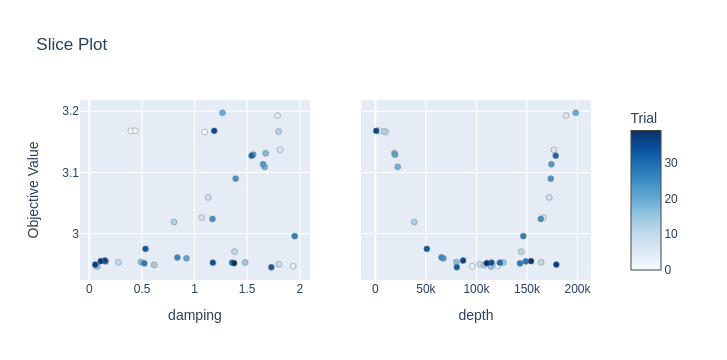

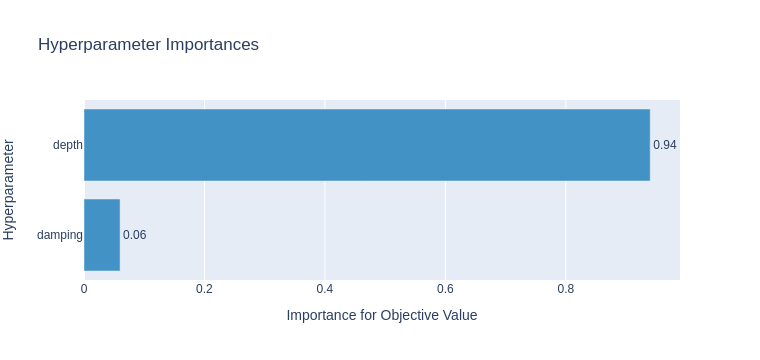

In [34]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
#     block_size=grav_spacing,
# )

# # set name and storage for the optimization
# study_name = f"synthetic_simple_regional_sep_indiv_eq_sources"
# fname = f"../optimization_logs/{study_name}.log"

# with warnings.catch_warnings():
#     warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#     storage = JournalStorage(JournalFileStorage(fname))

# # remove if exists
# for p in pathlib.Path(".").glob(f"{fname}*"):
#     pathlib.Path(p).unlink(missing_ok=True)

# # set number of runs per method
# n_trials=40

# # create study
# with warnings.catch_warnings():
#     warnings.filterwarnings("ignore", message="BoTorch")
#     study = optuna.create_study(
#         study_name=study_name,
#         storage=storage,
#         direction="minimize",
#         sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#         load_if_exists=True,
#         )

# # define the objective function
# objective = optimization.optimal_regional_eq_sources_params(
#     # damping_limits = [10^-5, 2],
#     # depth_limits = [1, 1000e3],
#     damping_limits = [0, 2],
#     depth_limits = [1, 200e3],
#     **regional_kwargs)

# # run the optimization
# with inv_utils.HiddenPrints():
#     with warnings.catch_warnings():
#         warnings.simplefilter("ignore")
#         study, study_df = optimization.optuna_parallel(
#             study_name=study_name,
#             study_storage=storage,
#             objective=objective,
#             n_trials=n_trials,
#             maximize_cpus=True,
#             parallel=True,
#         )

# # load studies
# study = optuna.load_study(storage=storage, study_name=study_name)
# study_df = study.trials_dataframe()

# print(study.best_params)

# regional_kwargs["param"]=study.best_params["depth"]
# regional_kwargs["eq_damping"]=study.best_params["damping"]

# optuna.visualization.plot_slice(study).show()
# optuna.visualization.plot_param_importances(study).show()

# rmse, df_anomalies = inv_utils.regional_seperation_quality(
#     regional_method="eq_sources",
#     comparison_method="regional_comparison",
#     **regional_kwargs,
# )

# # anom_grids = plotting.anomalies_plotting(
# #     df_anomalies,
# #     region=regional_kwargs.get("inversion_region"),
# #     grav_spacing=regional_kwargs.get("grav_spacing"),
# #     title=f"Method: eq_sources, Optimization score: {round(rmse,2)} mGal",
# #     constraints=regional_kwargs.get("constraints"),
# #     input_forward_column=regional_kwargs.get("input_forward_column"),
# #     input_grav_column=regional_kwargs.get("input_grav_column"),
# # )

In [35]:
# best_regional_kwargs["eq_sources"] = dict(
#     regional_method="eq_sources",
#     eq_sources=study.best_params["depth"],
#     eq_damping=study.best_params["damping"],
#     block_size=grav_spacing,
# )
# best_regional_kwargs

{'filter': {'regional_method': 'filter', 'filter': 'g30000'},
 'trend': {'regional_method': 'trend', 'trend': 3},
 'eq_sources': {'regional_method': 'eq_sources',
  'eq_sources': 80554.46411230009,
  'eq_damping': 1.730148380404709,
  'block_size': 1000.0}}

## Optimize constraints method
function `regional_seperation` already does a cross validation to find the optimal parameters if using Verde to grid. Use the below code to check the provided limits of dampings and mindists are suitable

In [37]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     constraints=constraints,
# )

# dampings = np.logspace(-8, -5, num=20)

# _ = regional.regional_seperation(
#     regional_method="constraints",
#     constraint_block_size=grav_spacing,
#     grid_method="verde",
#     dampings = dampings,
#     **regional_kwargs,
# )

Highest score: 0.9870201115538076
Best damping: 8.858667904100832e-08
Best mindist: 526.7894736842105


In [38]:
# best_regional_kwargs["constraints"] = dict(
#     regional_method="constraints",
#     grid_method="verde",
#     dampings = dampings,
#     constraint_block_size=grav_spacing,
# )
# best_regional_kwargs

{'filter': {'regional_method': 'filter', 'filter': 'g30000'},
 'trend': {'regional_method': 'trend', 'trend': 3},
 'eq_sources': {'regional_method': 'eq_sources',
  'eq_sources': 80554.46411230009,
  'eq_damping': 1.730148380404709,
  'block_size': 1000.0},
 'constraints': {'regional_method': 'constraints',
  'grid_method': 'verde',
  'dampings': array([1.00000000e-08, 1.43844989e-08, 2.06913808e-08, 2.97635144e-08,
         4.28133240e-08, 6.15848211e-08, 8.85866790e-08, 1.27427499e-07,
         1.83298071e-07, 2.63665090e-07, 3.79269019e-07, 5.45559478e-07,
         7.84759970e-07, 1.12883789e-06, 1.62377674e-06, 2.33572147e-06,
         3.35981829e-06, 4.83293024e-06, 6.95192796e-06, 1.00000000e-05]),
  'mindists': array([   1.        ,   53.57894737,  106.15789474,  158.73684211,
          211.31578947,  263.89473684,  316.47368421,  369.05263158,
          421.63157895,  474.21052632,  526.78947368,  579.36842105,
          631.94736842,  684.52631579,  737.10526316,  789.68421053

# Compare inversion RMSEs with best of each regional method

In [43]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
# )

# anom_dfs = []
# for i, (k,v) in enumerate(tqdm(best_regional_kwargs.items())):
#     print(k)
#     df = regional.regional_seperation(
#         **v,
#         **regional_kwargs,
#     )
#     anom_dfs.append(df)

# reg_grids = []
# res_grids = []
# for i in anom_dfs:
#     ds = i.set_index(["northing","easting"]).to_xarray()
#     reg_grids.append(ds.reg)
#     res_grids.append(ds.res)

  0%|          | 0/4 [00:00<?, ?it/s]

filter
trend
eq_sources
constraints
Highest score: 0.9870201115538076
Best damping: 8.858667904100832e-08
Best mindist: 526.7894736842105


In [151]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# inversion_kwargs = dict(
#     input_grav_column="Gobs_shift",
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     inversion_region = inversion_region,
# )

# # set number of CV runs for each method
# n_trials = 10

# for i, (j,v) in enumerate(tqdm(best_regional_kwargs.items())):
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_optimization_{j}"
#     fname = f"../optimization_logs/{study_name}.log"
#     results_fname = f"../synthetic_data/{study_name}"

#     #####
#     # Option 1: Run CV on each method
#     #####
#     # remove if exists
#     for p in pathlib.Path(".").glob(f"{fname}*"):
#         pathlib.Path(p).unlink(missing_ok=True)

#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # create study
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="BoTorch")
#         study = optuna.create_study(
#             study_name=study_name,
#             storage=storage,
#             direction="minimize",
#             sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#             load_if_exists=True,
#         )
#     # define the objective function
#     objective_func = optimization.CV_inversion(
#         training_data = anom_dfs[i][anom_dfs[i].test==False],
#         testing_data = anom_dfs[i][anom_dfs[i].test==True],
#         fname = results_fname,
#         starting_prisms = starting_prisms,
#         true_surface = layer1,
#         damping_limits = [-4, -1],  # damping = 10^damping_limit
#         damping_step = .1,
#         **inversion_kwargs,
#     )
#     # run the optimization
#     study, study_df = optimization.optuna_parallel(
#         study_name=study_name,
#         study_storage=storage,
#         objective = objective_func,
#         n_trials=n_trials,
#         maximize_cpus=True,
#         parallel=True,
#     )
#     #####
#     # end of option 1
#     #####
#     #####
#     # Option 2: Invert each method without using CV
#     #####
# #     # run best inversion for each method and save the prism_results df
# #     with inv_utils.HiddenPrints():
# #         rmse, prism_results, grav_results, params, elapsed_time, constraints_rmse  = inv.inversion_RMSE(
# #             input_grav=anom_dfs[i][anom_dfs[i].test==False],
# #             prism_layer = starting_prisms,
# #             true_surface = layer1,
# #             constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
# #             plot=False,
# #             solver_damping = 10**-2,
# #             l2_norm_tolerance=0.05,
# #             **inversion_kwargs,
# #         )

# #     results = dict(
# #             rmse = rmse,
# #             prism_results = prism_results,
# #             grav_results = grav_results,
# #             params = params,
# #             elapsed_time = elapsed_time,
# #             constraints_rmse = constraints_rmse,
# #         )
# #     #save results to pickle
# #     with open(f"{results_fname}_results.pickle", 'wb') as f:
# #         pickle.dump(results, f)
#     #####
#     # end of option 2
#     #####

  0%|          | 0/4 [00:00<?, ?it/s]

[I 2023-04-30 22:16:28,868] A new study created in Journal with name: synthetic_simple_regional_optimization_filter


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-04-30 22:21:12,909] A new study created in Journal with name: synthetic_simple_regional_optimization_trend


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-04-30 22:27:43,781] A new study created in Journal with name: synthetic_simple_regional_optimization_eq_sources


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

[I 2023-04-30 22:35:43,311] A new study created in Journal with name: synthetic_simple_regional_optimization_constraints


Optimizing:   0%|          | 0/10 [00:00<?, ?it/s]

In [44]:
# final_surfaces = []
# difs = []
# prism_results = []
# grav_results = []
# inversion_results = []
# for i, (j,v) in enumerate(best_regional_kwargs.items()):
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_optimization_{j}"
#     fname = f"../optimization_logs/{study_name}.log"
#     results_fname = f"../synthetic_data/{study_name}"

#     #####
#     # Option 1: use results from CV of each method
#     #####
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # load and plot past study
#     study = optuna.load_study(
#         study_name=study_name,
#         storage=storage,
#     )
#     print(study.best_params)
#     print(study.best_trial.number)

#     # load best inversion's results
#     with open(f"{results_fname}_trial_{study.best_trial.number}_results.pickle", 'rb') as f:
#         results = pickle.load(f)
#     #####
#     # end of option 1
#     #####
#     #####
#     # Option 2: use results from inversions with CV
#     #####
#     # load inversion's results
#     # with open(f"{results_fname}_results.pickle", 'rb') as f:
#     #     results = pickle.load(f)
#     #####
#     # end of option 2
#     #####
#     prism_ds = results["prism_results"].set_index(["northing", "easting"]).to_xarray()
#     cols = [s for s in results["prism_results"].columns.to_list() if "_layer" in s]
#     final_surface = prism_ds[cols[-1]]
#     dif = layer1 - final_surface

#     final_surfaces.append(final_surface)
#     prism_results.append(results["prism_results"])
#     grav_results.append(results["grav_results"])
#     difs.append(dif)
#     inversion_results.append(results)

{'damping': -2.4}
0
{'damping': -2.3}
2
{'damping': -2.3}
0
{'damping': -2.5999999999999996}
4


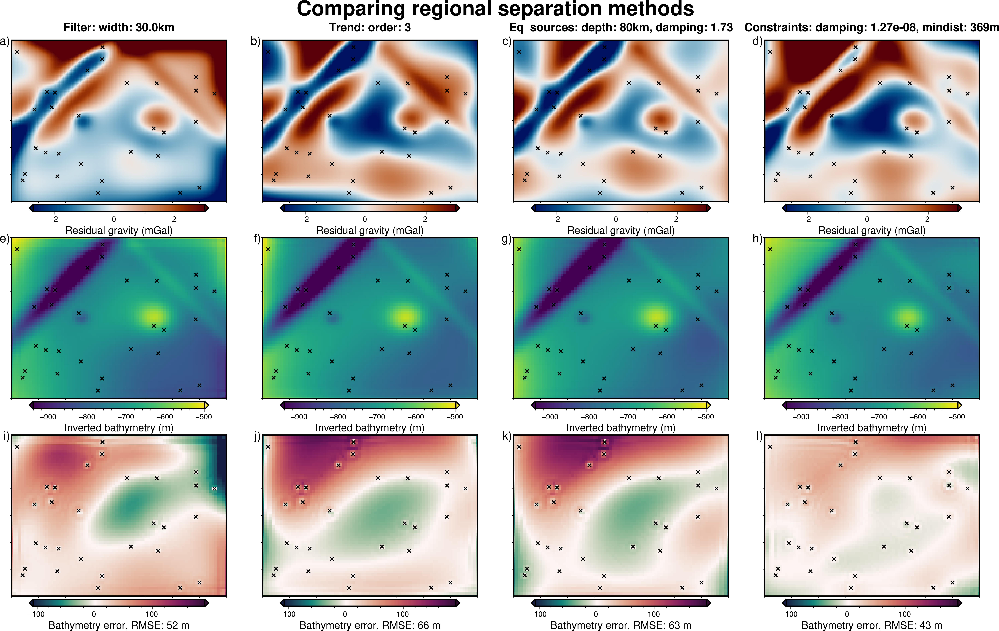

In [45]:
# # set color limits for each set of grids
# lims = [utils.get_min_max(i, robust=True) for i in res_grids]
# res_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# lims = [utils.get_min_max(i, robust=True) for i in final_surfaces]
# surface_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# lims = [utils.get_min_max(i, robust=True) for i in difs]
# dif_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# # set titles
# titles = []
# for i, (j,v) in enumerate(best_regional_kwargs.items()):
#     if j == "filter":
#         titles.append(f"{j.capitalize()}: width: {int(float(best_regional_kwargs['filter']['filter'][1:]))/1e3}km")
#     if j == "trend":
#         titles.append(f"{j.capitalize()}: order: {int(best_regional_kwargs['trend']['trend'])}")
#     if j == "eq_sources":
#         titles.append(
#             f"{j.capitalize()}: "
#             f"depth: {int(v['eq_sources']/1e3)}km, "
#             f"damping: {round(v['eq_damping'],2)}"
#         )
#     if j == "constraints":
#         titles.append(f"{j.capitalize()}: damping: 1.27e-08")

# # make subplot
# grids = res_grids + final_surfaces + difs
# fig = maps.subplots(
#     grids,
#     region = inversion_region,
#     dims = (3, len(inversion_results)),
#     fig_title = "Comparing regional separation methods",
#     subplot_titles = titles + [""]*8,
#     cbar_labels = ["Residual gravity (mGal)" for x in inversion_results] + \
#         ["Inverted bathymetry (m)" for x in inversion_results] + \
#         [f"Bathymetry error, RMSE: {int(x['rmse'])} m" for x in inversion_results],
#     autolabel = "a)+JTL+o0.1c/-.3c",
#     fig_height = 10,
#     margins = ".8c",
#     # grd2cpt=True,
#     cmaps = ["vik+h0" for x in inversion_results] + \
#         ["viridis" for x in inversion_results] + \
#         ["curl+h0" for x in inversion_results],
#     points = constraints.rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.3c",
#     points_pen = "1.5p",
#     cpt_limits = [res_lims]*len(inversion_results) + \
#         [surface_lims]*len(inversion_results) + \
#         [dif_lims]*len(inversion_results) ,
# )
# fig.show()

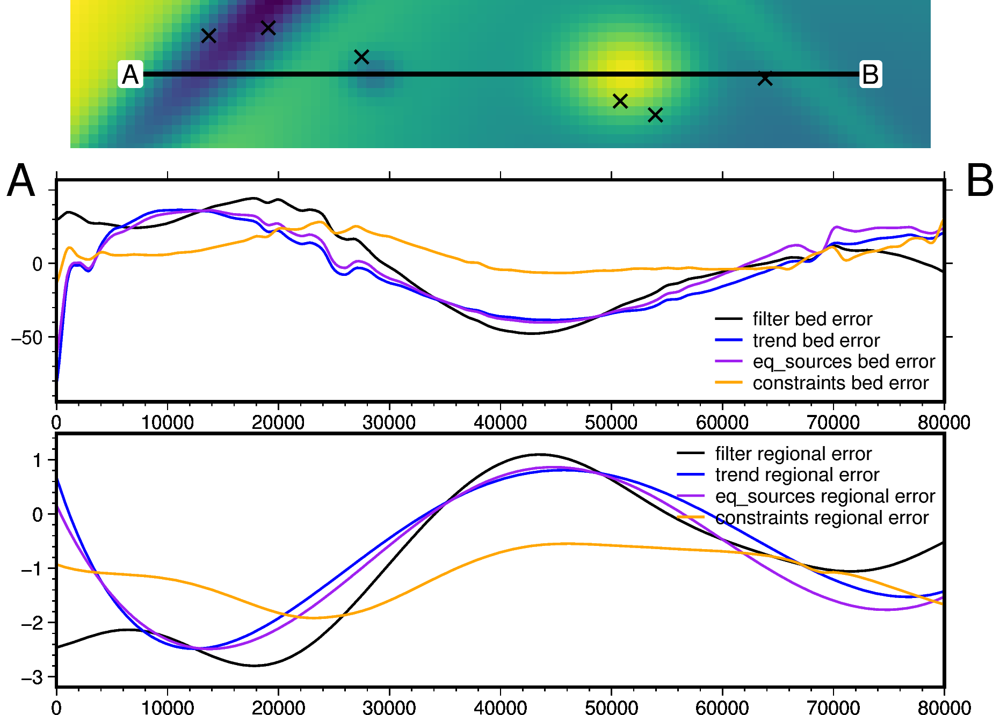

In [155]:
# plotting.plot_inversion_ensemble_results_profile(
#     prism_results,
#     grav_results,
#     input_forward_column="layer1_forward",
#     name_prefixes=[k for k,v in best_regional_kwargs.items()],
#     constraints = constraints,
#     true_surface = layer1,
#     true_regional = full_res_grav.set_index(["northing","easting"]).to_xarray().Surface2,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.1,
#     layers_legend_loc="jBR",
#     data_legend_loc="jTR",
# )

In [ ]:
# plotting.plot_regional_gridding_ensemble_profile(
#     grav_results,
#     name_prefixes=[i for i,j in enumerate(grav_results)],
#     constraints = constraints,
#     true_regional = full_res_grav.set_index(["northing","easting"]).to_xarray().Surface2,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.1,
#     layers_legend_loc="jBR",
#     data_legend_loc="jTR",

#     layers_line_cmap = "viridis",
#     layers_color = df.cell_size.values,
#     data_cmap = "matter",
#     data_color = df.cell_size.values,
#     layers_legend = False,
#     data_legend = False,
# )

# Compare inversion RMSE's with gridding methods of constraints seperation

In [16]:
# regional_kwargs = dict(
#     input_grav=full_res_grav,
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs_shift",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
#     constraints=constraints,
#     regional_method = "constraints"
# )

# # trial and compare different methods of the constraints techniquie
# constraint_args = [
#     dict(grid_method="pygmt", tension_factor=0),
#     dict(grid_method="pygmt", tension_factor=.25),
#     dict(grid_method="pygmt", tension_factor=1),
#     dict(grid_method="verde",
#         dampings = np.logspace(-9, -5, num=20),
# ]

# anom_dfs = []
# for i in constraint_args:
#     df = regional.regional_seperation(
#         **i,
#         **regional_kwargs,
#     )
#     anom_dfs.append(df)

# reg_grids = []
# res_grids = []
# for i in anom_dfs:
#     ds = i.set_index(["northing","easting"]).to_xarray()
#     reg_grids.append(ds.reg)
#     res_grids.append(ds.res)

# res_up_deriv_grids = [inv_utils.filter_grid(g, filt_type="up_deriv") for g in res_grids]

Highest score: 0.9925590724124946
Best damping: 2.06913808111479e-07
Best mindist: 526.7894736842105


In [159]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# inversion_kwargs = dict(
#     input_grav_column="Gobs_shift",
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     inversion_region = inversion_region,
# )

# # set number of CV runs for each method
# n_trials = 40

# for i, df in enumerate(tqdm(anom_dfs)):
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_optimization_constraints_comparison_{i}"
#     fname = f"../optimization_logs/{study_name}.log"
#     results_fname = f"../synthetic_data/{study_name}"

#     #####
#     # Option 1: Run CV on each method
#     #####
#     # remove if exists
#     for p in pathlib.Path(".").glob(f"{fname}*"):
#         pathlib.Path(p).unlink(missing_ok=True)

#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # create study
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="BoTorch")
#         study = optuna.create_study(
#             study_name=study_name,
#             storage=storage,
#             direction="minimize",
#             sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#             load_if_exists=True,
#         )
#     # define the objective function
#     objective_func = optimization.CV_inversion(
#         training_data = df[df.test==False],
#         testing_data = df[df.test==True],
#         fname = results_fname,
#         starting_prisms = starting_prisms,
#         true_surface = layer1,
#         damping_limits = [-4, -1],  # damping = 10^damping_limit
#         damping_step = .1,
#         **inversion_kwargs,
#     )
#     # run the optimization
#     study, study_df = optimization.optuna_parallel(
#         study_name=study_name,
#         study_storage=storage,
#         objective = objective_func,
#         n_trials=n_trials,
#         maximize_cpus=True,
#         parallel=True,
#     )
#     #####
#     # end of option 1
#     #####
#     #####
#     # Option 2: Invert each method without using CV
#     #####
# #     # run best inversion for each method and save the prism_results df
# #     with inv_utils.HiddenPrints():
# #         rmse, prism_results, grav_results, params, elapsed_time, constraints_rmse  = inv.inversion_RMSE(
# #             input_grav = df[df.test==False],
# #             prism_layer = starting_prisms,
# #             true_surface = layer1,
# #             constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
# #             plot=False,
# #             solver_damping = 10**-2.6,
# #             l2_norm_tolerance=0.05,
# #             **inversion_kwargs,
# #         )

# #     results = dict(
# #             rmse = rmse,
# #             prism_results = prism_results,
# #             grav_results = grav_results,
# #             params = params,
# #             elapsed_time = elapsed_time,
# #             constraints_rmse = constraints_rmse,
# #         )
# #     #save results to pickle
# #     with open(f"{results_fname}_results.pickle", 'wb') as f:
# #         pickle.dump(results, f)
#     #####
#     # end of option 2
#     #####

  0%|          | 0/4 [00:00<?, ?it/s]

[I 2023-04-30 22:55:20,569] A new study created in Journal with name: synthetic_simple_regional_optimization_constraints_comparison_0


Optimizing:   0%|          | 0/40 [00:00<?, ?it/s]

[I 2023-04-30 23:12:01,557] A new study created in Journal with name: synthetic_simple_regional_optimization_constraints_comparison_1


Optimizing:   0%|          | 0/40 [00:00<?, ?it/s]

[I 2023-04-30 23:29:32,714] A new study created in Journal with name: synthetic_simple_regional_optimization_constraints_comparison_2


Optimizing:   0%|          | 0/40 [00:00<?, ?it/s]

[I 2023-04-30 23:47:05,169] A new study created in Journal with name: synthetic_simple_regional_optimization_constraints_comparison_3


Optimizing:   0%|          | 0/40 [00:00<?, ?it/s]

In [17]:
# final_surfaces = []
# difs = []
# prism_results = []
# grav_results = []
# inversion_results = []
# for i, df in enumerate(anom_dfs):
#     # set name and storage for the optimization
#     study_name = f"synthetic_simple_regional_optimization_constraints_comparison_{i}"
#     fname = f"../optimization_logs/{study_name}.log"
#     results_fname = f"../synthetic_data/{study_name}"

#     #####
#     # Option 1: use results from CV of each method
#     #####
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # load and plot past study
#     study = optuna.load_study(
#         study_name=study_name,
#         storage=storage,
#     )

#     # load best inversion's results
#     # if i == 0:
#     #     print("using second best trials for tension=0")
#     #     top_trials = study.trials_dataframe().sort_values(by="value")
#     #     # print(top_trials.head())
#     #     print(top_trials.iloc[1].params_damping, top_trials.iloc[1].params_l2_norm_tolerance)
#     #     print(top_trials.iloc[1].number)
#     #     with open(f"{results_fname}_trial_{top_trials.iloc[1].number}_results.pickle", 'rb') as f:
#     #         results = pickle.load(f)
#     # else:
#     #     print(study.best_params)
#     #     print(study.best_trial.number)
#     #     with open(f"{results_fname}_trial_{study.best_trial.number}_results.pickle", 'rb') as f:
#     #         results = pickle.load(f)
#     print(study.best_params)
#     print(study.best_trial.number)
#     with open(f"{results_fname}_trial_{study.best_trial.number}_results.pickle", 'rb') as f:
#         results = pickle.load(f)
#     #####
#     # end of option 1
#     #####
#     #####
#     # Option 2: use results from inversions with CV
#     #####
#     # # load inversion's results
#     # with open(f"{results_fname}_results.pickle", 'rb') as f:
#     #     results = pickle.load(f)
#     #####
#     # end of option 2
#     #####
#     prism_ds = results["prism_results"].set_index(["northing", "easting"]).to_xarray()
#     cols = [s for s in results["prism_results"].columns.to_list() if "_layer" in s]
#     final_surface = prism_ds[cols[-1]]
#     dif = layer1 - final_surface

#     final_surfaces.append(final_surface)
#     prism_results.append(results["prism_results"])
#     grav_results.append(results["grav_results"])
#     difs.append(dif)
#     inversion_results.append(results)

{'damping': -2.5999999999999996}
16
{'damping': -2.5}
2
{'damping': -2.5}
37
{'damping': -2.5}
13


In [21]:
# sampled_values = []
# for g in res_grids:
#     sampled = profile.sample_grids(
#         constraints,
#         grid = g,
#         name = "sampled",
#         coord_names=("easting", "northing"),
#     ).sampled
#     sampled_values.append(sampled)
# sampled_values = [inv_utils.RMSE(x) for x in sampled_values]
# sampled_values

[0.010530922329128794,
 0.05839268739764859,
 0.3693854990421162,
 0.07849407242946367]

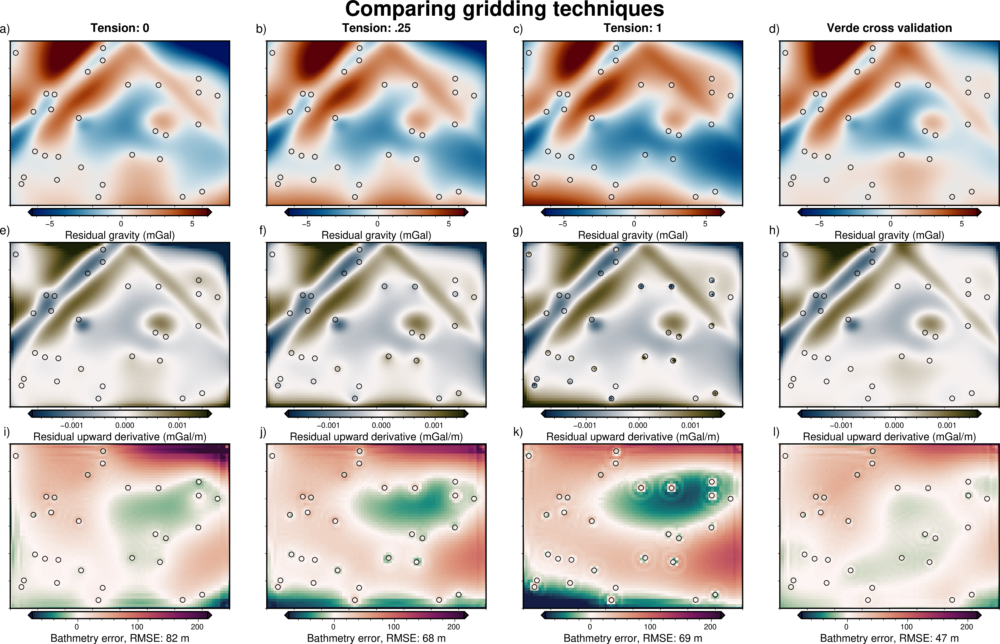

In [22]:
# # set color limits for each set of grids
# lims = [utils.get_min_max(i, robust=True) for i in res_grids]
# res_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# lims = [min([i[0] for i in lims]), max([i[1] for i in lims])]

# lims = [utils.get_min_max(i, robust=True) for i in res_up_deriv_grids]
# res_deriv_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# lims = [utils.get_min_max(i, robust=True) for i in difs]
# dif_lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

# # make subplot
# grids = res_grids + res_up_deriv_grids + difs
# fig = maps.subplots(
#     grids,
#     region = inversion_region,
#     dims = (3,len(inversion_results)),
#     fig_title = "Comparing gridding techniques",
#     subplot_titles = ["Tension: 0", "Tension: .25", "Tension: 1", "Verde cross validation"]\
#         + [""]*8,
#     cbar_labels = ["Residual gravity (mGal)" for x in inversion_results] + \
#         ["Residual upward derivative (mGal/m)" for x in inversion_results] + \
#         [f"Bathmetry error, RMSE: {int(x['rmse'])} m" for x in inversion_results],
#     autolabel = "+JTL+o0c/.5c",
#     fig_height = 10,
#     margins = ".8c",
#     # grd2cpt=True,
#     cmaps = ["vik+h0" for x in range(int((len(grids)+1)/3))] + \
#         ["diff+h0" for x in range(int((len(grids)+1)/3))] + \
#         ["curl+h0" for x in range(int((len(grids)+1)/3))],
#     points = constraints.rename(columns={"easting":"x","northing":"y"}),
#     points_style = "c0.3c",
#     points_fill = None,
#     cpt_limits = [res_lims]*len(inversion_results) + \
#         [res_deriv_lims]*len(inversion_results) + \
#         [dif_lims]*len(inversion_results),
# )
# fig.show()

In [ ]:
# print(inversion_region)
# maps.plot_grd(layer1, region=[inversion_region[0], inversion_region[1], 20e3, 40e3],
#               points=constraints.rename(columns={"easting":"x","northing":"y"}))

In [ ]:
# subset = utils.points_inside_region(
#     constraints,
#     region = [inversion_region[0], inversion_region[1], 20e3, 40e3],
#     names = ["easting", "northing"],
#     ).rename(columns={"easting":"x","northing":"y"}
#     ).drop(columns="upward")
# subset = subset.append(pd.DataFrame({"x":[inversion_region[0],inversion_region[1]], "y":[30e3, 30e3]}))
# subset = subset.reset_index(drop=True).sort_values(by="x")
# subset

In [ ]:
# plotting.plot_regional_gridding_ensemble_profile(
#     anom_dfs,
#     polyline = subset,
#     # start = [inversion_region[0], 30e3],
#     # stop = [inversion_region[1], 30e3],
#     name_prefixes=["Tension: 0", "Tension: .25", "Tension: 1", "Verde CV"],
#     constraints = constraints,
#     true_regional = full_res_grav.set_index(["northing","easting"]).to_xarray().Surface2,
#     map_buffer = 0.1,
#     layers_legend_loc="jBR",
#     data_legend_loc="jTR",
# )

In [ ]:
# grids = res_grids + res_up_deriv_grids
# fig = maps.subplots(
#     grids,
#     region = inversion_region,
#     dims = (2,4),
#     fig_title = "Comparing gridding techniques",
#     subplot_titles = [
#         "Tension: 0", "Tension: .25", "Tension: 1", "Verde cross validation",
#         "", "", "",""
#     ],
#     cbar_labels = ["residual gravity (mGal)" for x in range(int((len(grids)+1)/2))] + \
#         ["upward derivated" for x in range(int((len(grids)+1)/2))],
#     autolabel = True,
#     fig_height = 10,
#     margins = ".9c",
#     # grd2cpt=True,
#     cmaps = ["vik+h0" for x in range(len(grids))],
#     points = constraints.rename(columns={"easting":"x","northing":"y"}),
#     points_style = "c0.1c",
#     robust = True,
# )
# fig.show()

In [ ]:
# plotting.plot_regional_gridding_ensemble_profile(
#     grav_results,
#     name_prefixes=[i for i,j in enumerate(grav_results)],
#     constraints = constraints,
#     true_regional = full_res_grav.set_index(["northing","easting"]).to_xarray().Surface2,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.1,
#     layers_legend_loc="jBR",
#     data_legend_loc="jTR",

#     layers_line_cmap = "viridis",
#     layers_color = df.cell_size.values,
#     data_cmap = "matter",
#     data_color = df.cell_size.values,
#     layers_legend = False,
#     data_legend = False,
# )

# Final Regional seperation 

Highest score: 0.9870237627180662
Best damping: 8.858667904100832e-08
Best mindist: 521.0526315789474


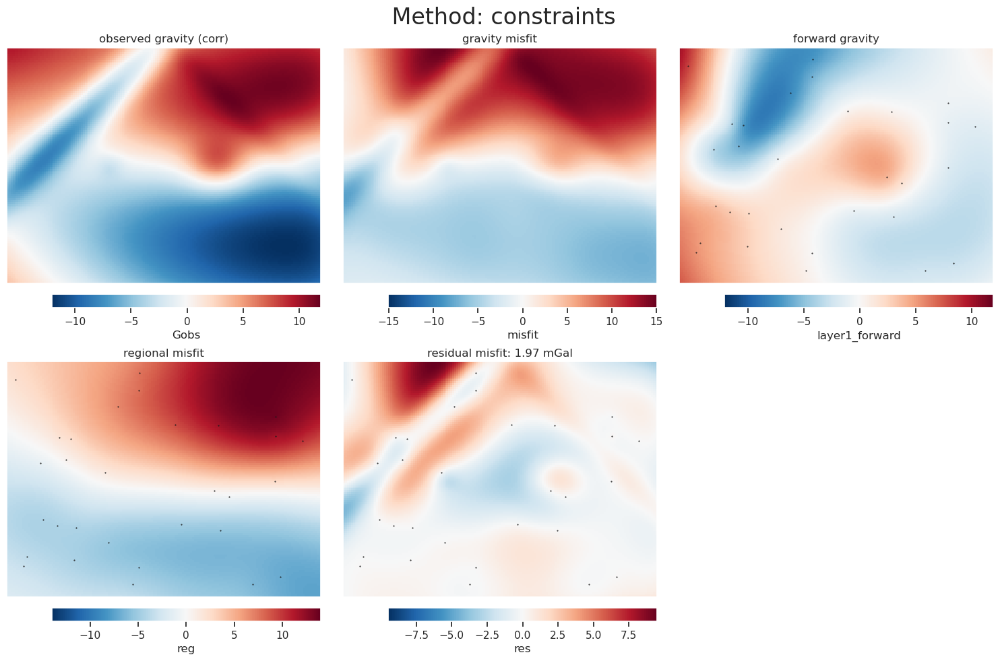

In [53]:
regional_kwargs = dict(
    input_grav=full_res_grav,
    input_forward_column="layer1_forward",
    input_grav_column="Gobs_shift",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-8, -6, num=20),
    # dampings=np.logspace(-9, -6, num=20),
    constraint_block_size=grav_spacing,
    block_size=grav_spacing,
)

# choose the regional method:
# regional_method = "filter"
# regional_method = "trend"
regional_method = "constraints"
# regional_method = "eq_sources"

df_anomalies = regional.regional_seperation(
    regional_method=regional_method,
    **regional_kwargs,
)

anom_grids = plotting.anomalies_plotting(
    df_anomalies,
    title=f" Method: {regional_method}",
    constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
    input_forward_column="layer1_forward",
    input_grav_column="Gobs",
    # plot_type="pygmt",
    plot_type="xarray",
    robust=False,
)

# _ = utils.grd_compare(
#     regional_kwargs.get("true_regional"),
#     df_anomalies.set_index(["northing","easting"]).to_xarray().reg,
#     grid1_name="True regional gravity",
#     grid2_name="Calculated regional gravity",
#     title=f"Method: {regional_method}",
#     plot=True,
#     region=kwargs.get("inversion_region"),
#     plot_type="pygmt",
#     cmap="vik",
#     diff_cmap="vik+h0",
#     hist=True,
#     inset=False,
#     points_style="c.15c",
#     subplot_labels=True,
#     # robust=True,
#     robust=False,
#     verbose="q",
#     cbar_label="mGal",
# )

### Save and load results

In [54]:
df_anomalies.to_csv(
    "../synthetic_data/simple_regional_gravity_anomalies.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [9]:
df_anomalies = pd.read_csv(
    "../synthetic_data/simple_regional_gravity_anomalies.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

df_anomalies

,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,4.895946,-1.585934,3.310012,False,1000.0,7.336436,5.232072,-2.104363,-1.986661,-0.117702
1,0.0,500.0,4.832540,-1.641775,3.190765,True,1000.0,7.196777,5.112826,-2.083951,-2.007522,-0.076429
2,0.0,1000.0,4.764286,-1.697236,3.067050,False,1000.0,7.053205,4.989111,-2.064094,-2.028804,-0.035290
3,0.0,1500.0,4.692135,-1.752310,2.939826,True,1000.0,6.907357,4.861886,-2.045471,-2.051127,0.005655
4,0.0,2000.0,4.616825,-1.806994,2.809832,False,1000.0,6.760484,4.731892,-2.028592,-2.074308,0.045716
...,...,...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,9.220126,False,1000.0,0.539365,11.142186,10.602822,13.588616,-2.985795
19477,60000.0,78500.0,0.821796,8.327652,9.149448,True,1000.0,0.610158,11.071509,10.461350,13.553292,-3.091941
19478,60000.0,79000.0,0.821311,8.246703,9.068014,False,1000.0,0.680730,10.990075,10.309345,13.516486,-3.207141
19479,60000.0,79500.0,0.820943,8.153546,8.974489,True,1000.0,0.750859,10.896550,10.145691,13.477902,-3.332211


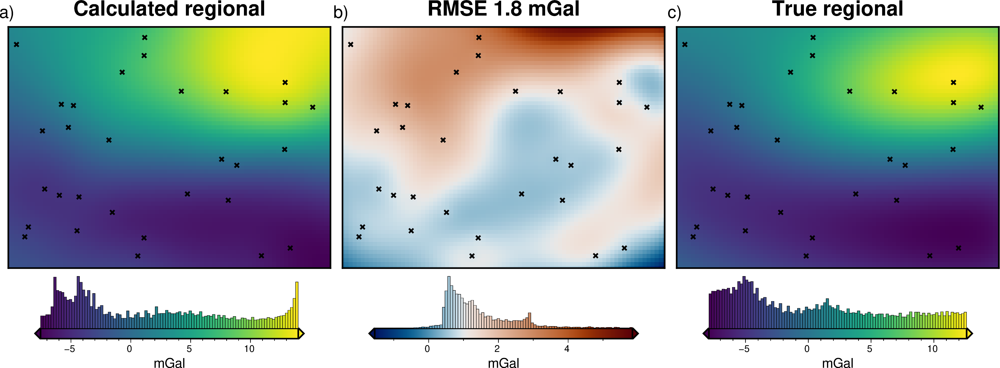

In [27]:
ds = (
    df_anomalies[df_anomalies.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
true_regional = ds.Surface2

fig = maps.plot_grd(
    ds.reg,
    fig_height=8,
    cmap="viridis",
    title="Calculated regional",
    cbar_label="mGal",
    # frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
    points_pen="1.5p",
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

dif = ds.reg - true_regional
fig = maps.plot_grd(
    dif,
    cmap=f"vik+h{np.nanmedian(dif)}",
    title=f"RMSE {round(inv_utils.RMSE(dif),1)} mGal",
    cbar_label="mGal",
    hist=True,
    cbar_yoffset=2,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
    points_pen="1.5p",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

fig = maps.plot_grd(
    true_regional,
    cmap="viridis",
    title="True regional",
    cbar_label="mGal",
    # frame=["nSwe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    fig=fig,
    origin_shift="xshift",
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
    points_pen="1.5p",
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

fig.show()

# Inversion

Now that we have $G_{misfit}$, we can run an inversion to attempt to recover the true Layer 2 topography. Theres a number of parameters to choose from for the inversion.

In [31]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist#**.5

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     solver_damping = 10**-2,
#     plot_convergence=True,
# )

# df_anomalies = anom_dfs[-1]
# # with inv_utils.HiddenPrints():
# results = inv.inversion_RMSE(
#     input_grav=df_anomalies[df_anomalies.test==False],
#     inversion_region=inversion_region,
#     true_surface = layer1,
#     constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     plot=True,
#     plot_type="xarray",
#     robust=True,
#     **kwargs,
# )

# (
#     rmse,
#     prism_results,
#     grav_results,
#     params,
#     elapsed_time,
#     constraints_rmse,
# ) = results

# _ = plotting.plot_inversion_results(
#         grav_results,
#         prism_results,
#         params,
#         grav_region=inversion_region,
#         plot_iter_results=True,
#         plot_topo_results=True,
#         plot_grav_results=True,
#         iters_to_plot=4,
#         grav_spacing=grav_spacing,
#         constraints=constraints,
#     )

# print(f"RMSE: {rmse}")
# print(f"constraints RMSE: {constraints_rmse}")

In [ ]:
# plotting.plot_inversion_results_profile(
#     results[1],
#     results[2],
#     input_forward_column="layer1_forward",
#     constraints = constraints,
#     true_surface = layer1,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.1,
#     legend_loc="JTR+jTR",
# )

## Full resolution grav, no noise

### Optimize only for damping

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]
Best score: 0.024541241590256817
Best damping: 0.004641588833612777


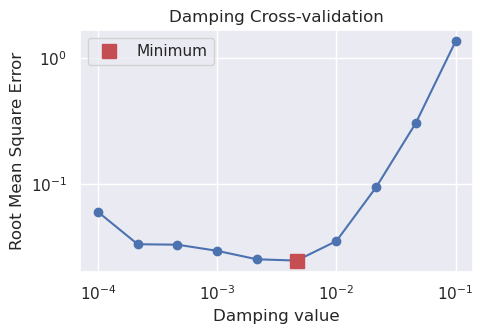

In [10]:
starting_prisms = copy.deepcopy(layer1_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    # region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../synthetic_data/synthetic_simple_regional_damping_CV"

dampings = np.logspace(-4, -1, 10)
print(f"Damping values: {dampings}")

# scores, rmses = inv.inversion_optimal_parameters(
#     training_data= df_anomalies[df_anomalies.test==False],
#     testing_data = df_anomalies[df_anomalies.test==True],
#     parameter_values = dampings,
#     function = inv.inversion_damping_MSE,
#     plot = False,
#     plot_grids = False,
#     results_fname=fname,
#     progressbar=True,
#     true_surface=layer1,
#     inversion_region=inversion_region,
#     **kwargs,
# )

# # put scores and damping values into dict
# CV_results = dict(
#     scores=scores, dampings=dampings, rmses=rmses)

# # remove if exists
# pathlib.Path(fname).unlink(missing_ok=True)

# # save scores and dampings to pickle
# with open(f"{fname}.pickle", 'wb') as f:
#     pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)

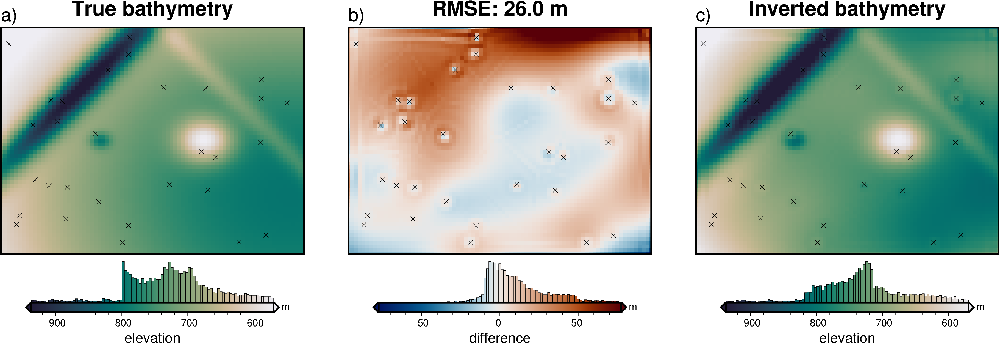

RMSE: 25.9666703686329
constraints RMSE: 2.26


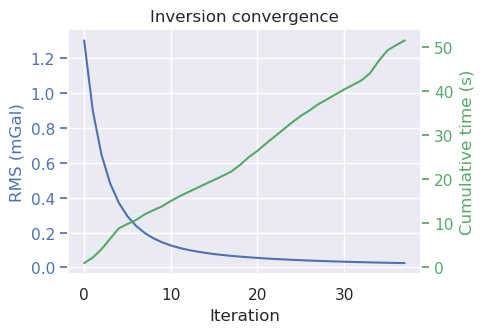

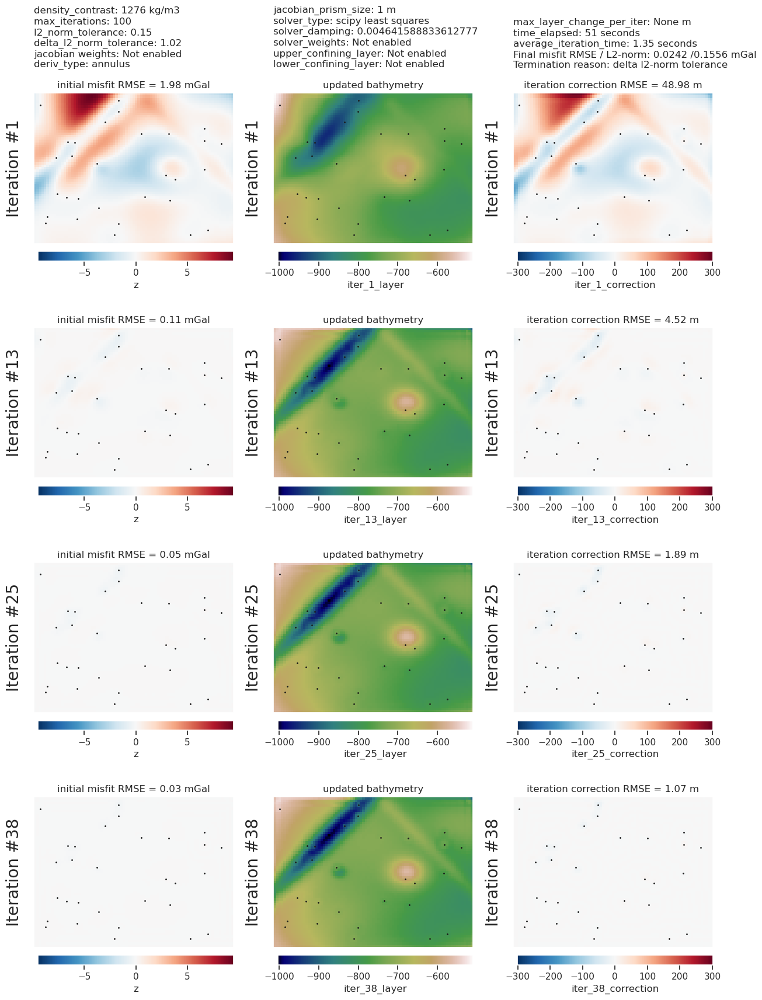

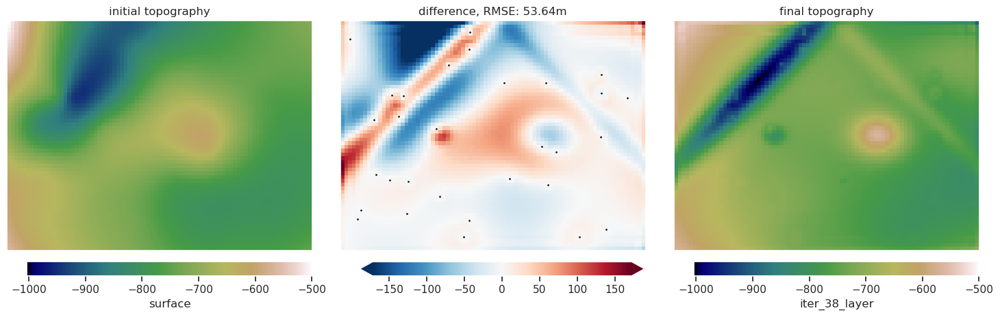

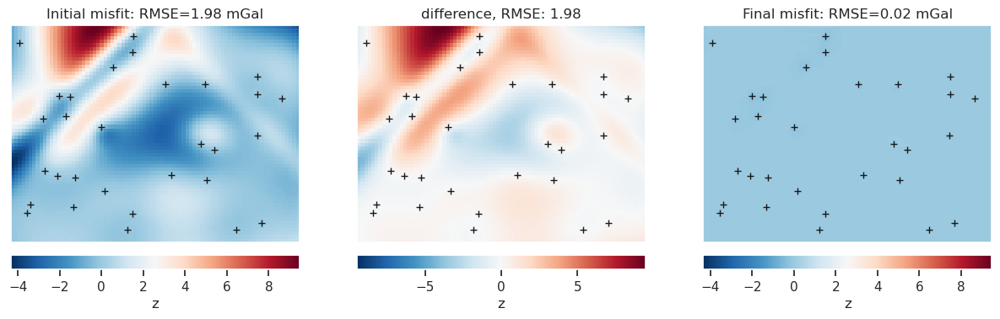

In [74]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_anomalies[df_anomalies.test == False],
        inversion_region=inversion_region,
        true_surface=layer1,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j0c/.2c",
        # title_font = "16p,Helvetica-Bold,black",
        robust=True,
        **kwargs,
    )

plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints,
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

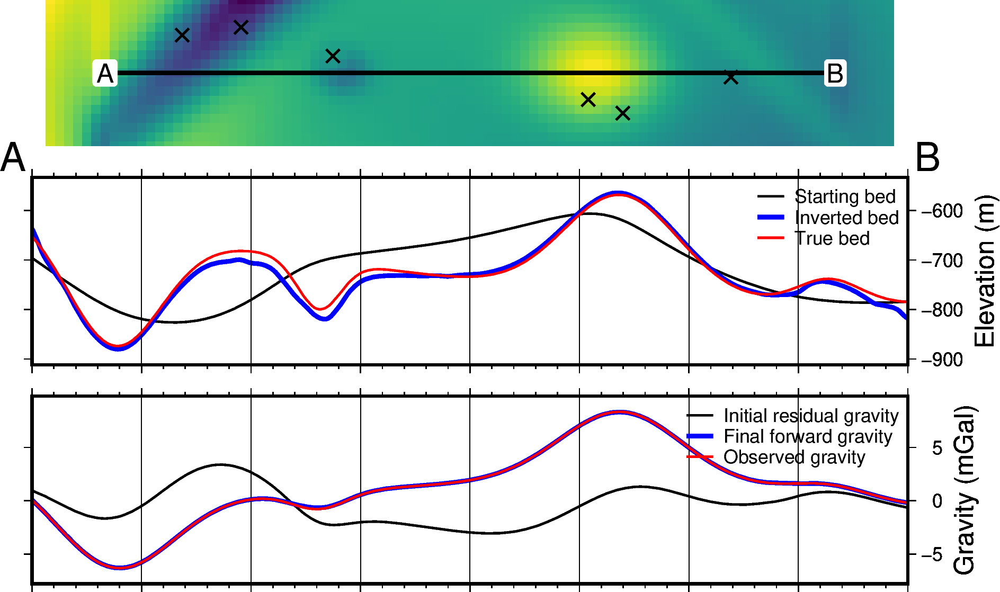

In [75]:
plotting.plot_inversion_results_profile(
    inv_result[1],
    inv_result[2],
    input_forward_column="layer1_forward",
    constraints=constraints,
    true_surface=layer1,
    start=[inversion_region[0], 30e3],
    stop=[inversion_region[1], 30e3],
    map_buffer=0.1,
    subplot_orientation="vertical",
    data_legend_loc="jTR+o0c",
    layers_legend_loc="jTR+o0c",
    layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
    data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
)

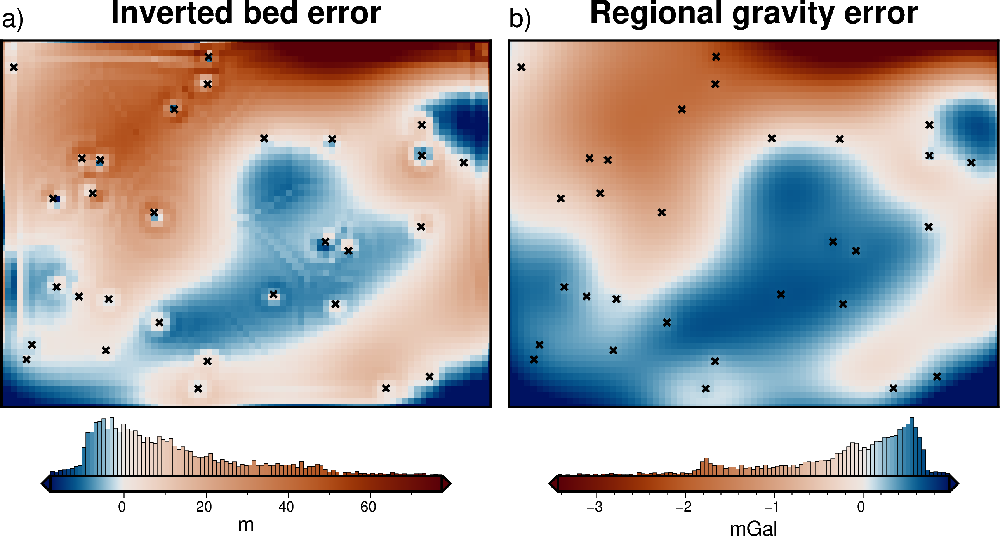

In [11]:
# inverted bed error
ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

final_bed = final_bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
true_bed = layer1.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
bed_dif = true_bed - final_bed

# regional separation error
ds = (
    df_anomalies[df_anomalies.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
true_reg = ds.Surface2
reg_dif = true_reg - ds.reg
reg_dif -= np.nanmedian(reg_dif)


fig = maps.plot_grd(
    bed_dif,
    fig_height=8,
    title="Inverted bed error",
    hist=True,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
    points_pen="1.5p",
    cmap="vik+h0",
    cbar_label="m",
    cbar_yoffset=1.5,
    robust=True,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j0c/.3",
    no_clip=True,
)
fig = maps.plot_grd(
    reg_dif,
    title="Regional gravity error",
    cmap=f"vik+h0",
    reverse_cpt=True,
    fig=fig,
    hist=True,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
    points_pen="1.5p",
    origin_shift="xshift",
    cbar_label="mGal",
    cbar_yoffset=1.5,
    robust=True,
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j0c/.3",
    no_clip=True,
)
fig.show()

## Full resolution grav with noise

The above inversion was able to fully recover Layer 2. This is expected, since there was no noise in the data, and we used a very simple 2 layer model to create the observed gravity. Next we add 2% gaussian noise to $G_{misfit}$ to see how the inversion performs.

Standard deviation used for noise: [0.24103371167929646]
method: constraints, parameter: 0.25
DC shifted observed gravity by -2.1mGal to match forward gravity.
Highest score: 0.9896784566709051
Best damping: 3.359818286283781e-07
Best mindist: 526.7894736842105


,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,4.895946,-1.585934,3.736310,False,1000.0,7.336436,5.836312,-1.500124,-1.890447,0.390323
1,0.0,500.0,4.832540,-1.641775,3.288318,True,1000.0,7.196777,5.388320,-1.808457,-1.911511,0.103054
2,0.0,1000.0,4.764286,-1.697236,3.304061,False,1000.0,7.053205,5.404063,-1.649142,-1.932977,0.283836
3,0.0,1500.0,4.692135,-1.752310,3.481059,True,1000.0,6.907357,5.581060,-1.326297,-1.955447,0.629150
4,0.0,2000.0,4.616825,-1.806994,3.261078,False,1000.0,6.760484,5.361080,-1.399404,-1.978734,0.579330
...,...,...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,8.948735,False,1000.0,0.539365,11.048737,10.509372,15.772605,-5.263233
19477,60000.0,78500.0,0.821796,8.327652,9.297307,True,1000.0,0.610158,11.397308,10.787150,15.753807,-4.966657
19478,60000.0,79000.0,0.821311,8.246703,9.172418,False,1000.0,0.680730,11.272419,10.591689,15.733931,-5.142241
19479,60000.0,79500.0,0.820943,8.153546,9.187471,True,1000.0,0.750859,11.287472,10.536613,15.712789,-5.176176


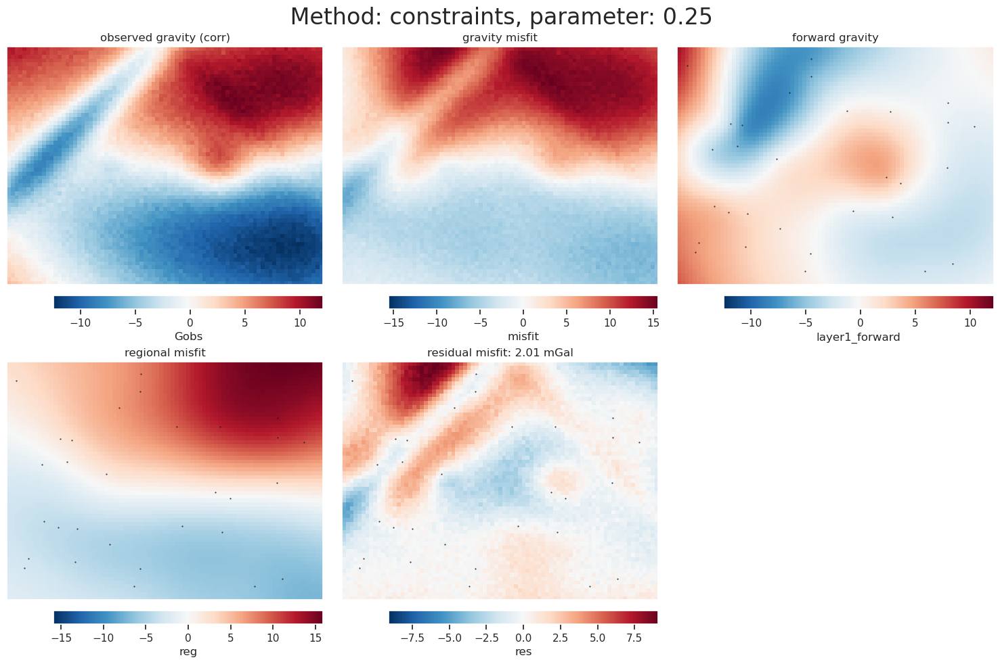

In [65]:
# contaminate with noise
full_res_grav_noise = full_res_grav.copy()
full_res_grav_noise["Gobs"] = synthetic.contaminate(
    full_res_grav_noise.Gobs,
    stddev=0.02,
    percent=True,
    seed=0,
)

regional_kwargs = dict(
    input_grav=full_res_grav_noise,
    input_forward_column="layer1_forward",
    input_grav_column="Gobs",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-9, -6, num=20),
)

# choose the regional method:
# regional_method = "filter"
# regional_method = "trend"
regional_method = "constraints"
# regional_method = "eq_sources"

# set the parameter:
param = 0.25

print(f"method: {regional_method}, parameter: {param}")

df_anomalies_noise = regional.regional_seperation(
    regional_method=regional_method,
    filter=f"g{param}",
    trend=int(param),
    fill_method="pygmt",
    tension_factor=param,
    eq_sources=param,
    depth_type="relative",
    eq_damping=None,
    block_size=grav_spacing,
    **regional_kwargs,
)

anom_grids = plotting.anomalies_plotting(
    df_anomalies_noise[df_anomalies_noise.test == False],
    title=f" Method: {regional_method}, parameter: {param}",
    constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
    input_forward_column="layer1_forward",
    input_grav_column="Gobs",
    # plot_type="pygmt",
    plot_type="xarray",
    robust=False,
)

df_anomalies_noise

### Save and load results

In [66]:
df_anomalies_noise.to_csv(
    "../synthetic_data/simple_regional_noise_gravity_anomalies.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [79]:
df_anomalies_noise = pd.read_csv(
    "../synthetic_data/simple_regional_noise_gravity_anomalies.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_anomalies_noise

,northing,easting,Surface1,Surface2,Gobs,test,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,4.895946,-1.585934,3.736310,False,1000.0,7.336436,5.836312,-1.500124,-1.890447,0.390323
1,0.0,500.0,4.832540,-1.641775,3.288318,True,1000.0,7.196777,5.388320,-1.808457,-1.911511,0.103054
2,0.0,1000.0,4.764286,-1.697236,3.304061,False,1000.0,7.053205,5.404063,-1.649142,-1.932977,0.283836
3,0.0,1500.0,4.692135,-1.752310,3.481059,True,1000.0,6.907357,5.581060,-1.326297,-1.955447,0.629150
4,0.0,2000.0,4.616825,-1.806994,3.261078,False,1000.0,6.760484,5.361080,-1.399404,-1.978734,0.579330
...,...,...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,0.822520,8.397605,8.948735,False,1000.0,0.539365,11.048737,10.509372,15.772605,-5.263233
19477,60000.0,78500.0,0.821796,8.327652,9.297307,True,1000.0,0.610158,11.397308,10.787150,15.753807,-4.966657
19478,60000.0,79000.0,0.821311,8.246703,9.172418,False,1000.0,0.680730,11.272419,10.591689,15.733931,-5.142241
19479,60000.0,79500.0,0.820943,8.153546,9.187471,True,1000.0,0.750859,11.287472,10.536613,15.712789,-5.176176


In [119]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# weights, min_dist = inv_utils.constraints_grid(
#     constraints,
#     starting_prisms,
#     inner_bound=layer_spacing,
#     outer_bound=layer_spacing*2,
#     low=0,
#     high=1,
#     # region=inversion_region, # causes edge effects if provided
#     interp_type="spline",
# )
# starting_prisms["weights"] = weights
# starting_prisms["min_dist"] = min_dist

# # min_dist = inv_utils.normalized_mindist(
# #     constraints,
# #     starting_prisms,
# #     mindist = layer_spacing/np.sqrt(2),
# #     low = 0,
# #     high = 1,
# #     # region=inversion_region,
# # )
# # starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.48, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     solver_damping =  0.00464158,
#     plot_convergence=True,
# )

# # with inv_utils.HiddenPrints():
# results = inv.inversion_RMSE(
#     input_grav=df_anomalies_noise[df_anomalies_noise.test==False],
#     inversion_region=inversion_region,
#     true_surface = layer1,
#     constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     plot=True,
#     plot_type="xarray",
#     # robust=True,
#     **kwargs,
# )

# (
#     rmse,
#     prism_results,
#     grav_results,
#     params,
#     elapsed_time,
#     constraints_rmse,
# ) = results

# _ = plotting.plot_inversion_results(
#         grav_results,
#         prism_results,
#         params,
#         grav_region=inversion_region,
#         plot_iter_results=True,
#         plot_topo_results=True,
#         plot_grav_results=True,
#         iters_to_plot=4,
#         grav_spacing=grav_spacing,
#         constraints=constraints,
#     )

# print(f"RMSE: {rmse}")
# print(f"constraints RMSE: {constraints_rmse}")

In [120]:
# plotting.plot_inversion_results_profile(
#     results[1],
#     results[2],
#     input_forward_column="layer1_forward",
#     constraints = constraints,
#     true_surface = layer1,
#     start = [inversion_region[0], 30e3],
#     stop = [inversion_region[1], 30e3],
#     map_buffer = 0.1,
#     legend_loc="JTR+jTR",
# )

### Optimize only for damping

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]
Best score: 0.2770005119197557
Best damping: 0.004641588833612777


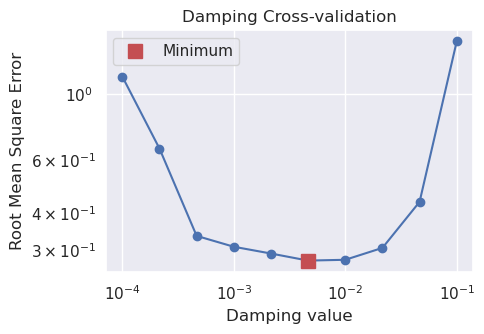

In [80]:
starting_prisms = copy.deepcopy(layer1_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    # region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.48,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../synthetic_data/synthetic_simple_regional_noise_damping_CV"

dampings = np.logspace(-4, -1, 10)
print(f"Damping values: {dampings}")

# scores, rmses = inv.inversion_optimal_parameters(
#     training_data= df_anomalies_noise[df_anomalies_noise.test==False],
#     testing_data = df_anomalies_noise[df_anomalies_noise.test==True],
#     parameter_values = dampings,
#     function = inv.inversion_damping_MSE,
#     plot = False,
#     plot_grids = False,
#     results_fname=fname,
#     progressbar=True,
#     true_surface=layer1,
#     inversion_region=inversion_region,
#     **kwargs,
# )

# # put scores and damping values into dict
# CV_results = dict(
#     scores=scores, dampings=dampings, rmses=rmses)

# # remove if exists
# pathlib.Path(fname).unlink(missing_ok=True)

# # save scores and dampings to pickle
# with open(f"{fname}.pickle", 'wb') as f:
#     pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)

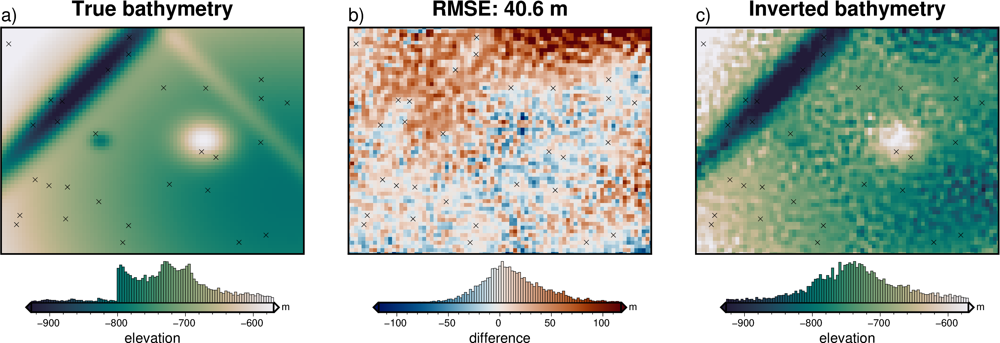

RMSE: 40.593437548754345
constraints RMSE: 1.52


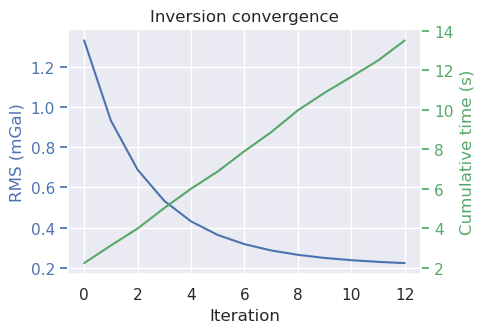

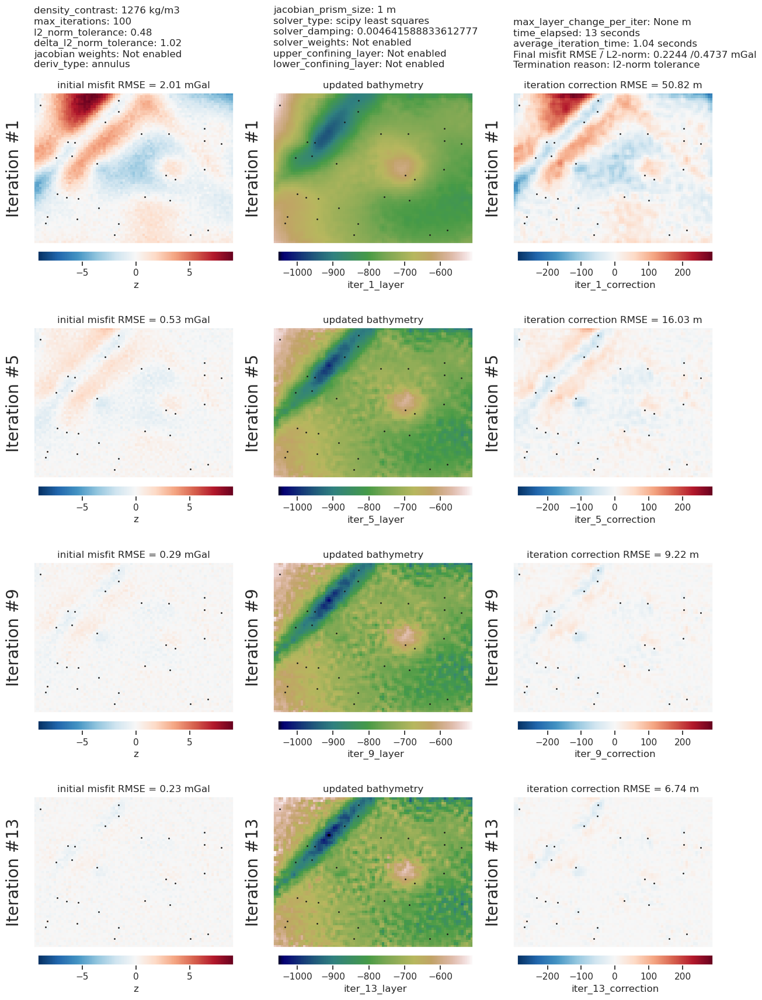

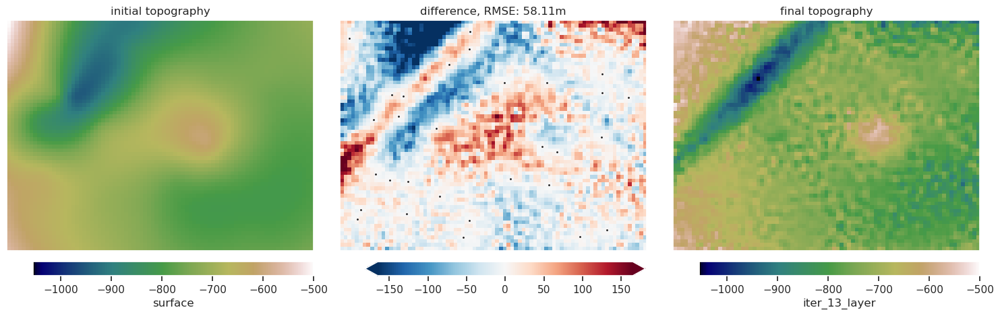

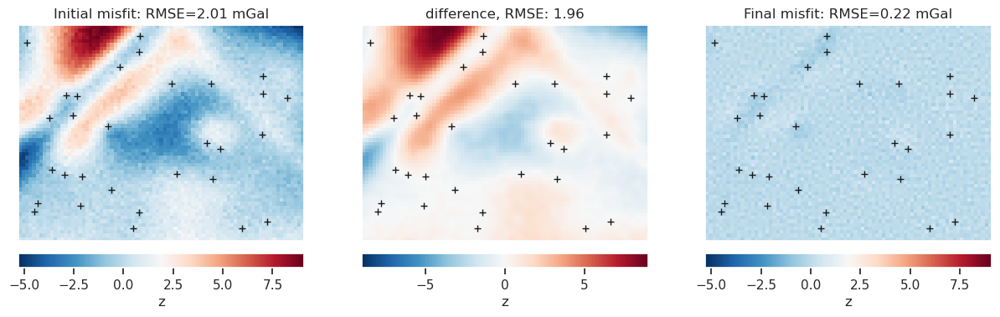

In [70]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_anomalies_noise[df_anomalies_noise.test == False],
        inversion_region=inversion_region,
        true_surface=layer1,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j0c/.2c",
        # title_font = "16p,Helvetica-Bold,black",
        robust=True,
        **kwargs,
    )

plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints,
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

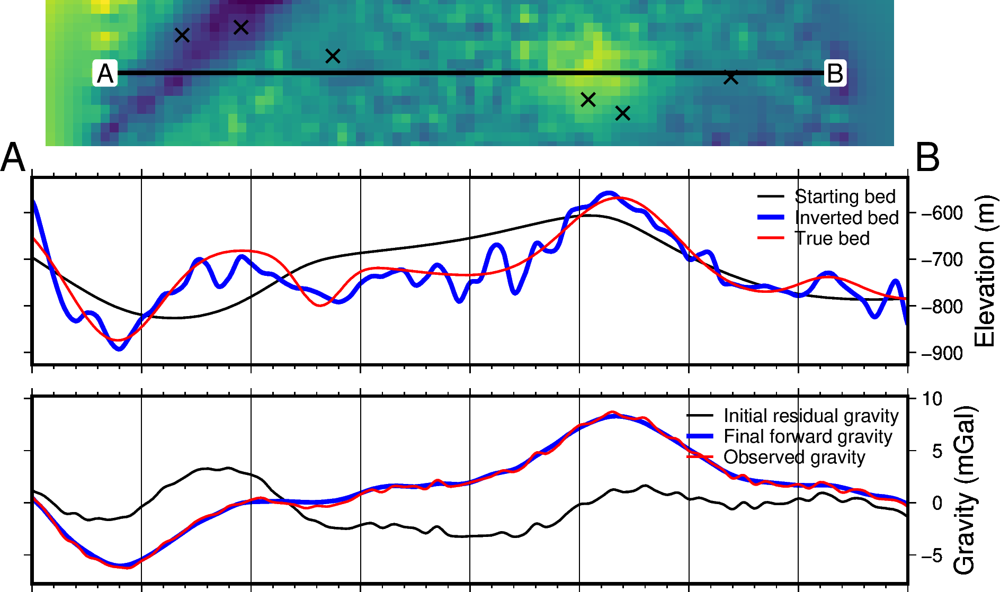

In [71]:
plotting.plot_inversion_results_profile(
    inv_result[1],
    inv_result[2],
    input_forward_column="layer1_forward",
    constraints=constraints,
    true_surface=layer1,
    start=[inversion_region[0], 30e3],
    stop=[inversion_region[1], 30e3],
    map_buffer=0.1,
    subplot_orientation="vertical",
    data_legend_loc="jTR+o0c",
    layers_legend_loc="jTR+o0c",
    layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
    data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
)

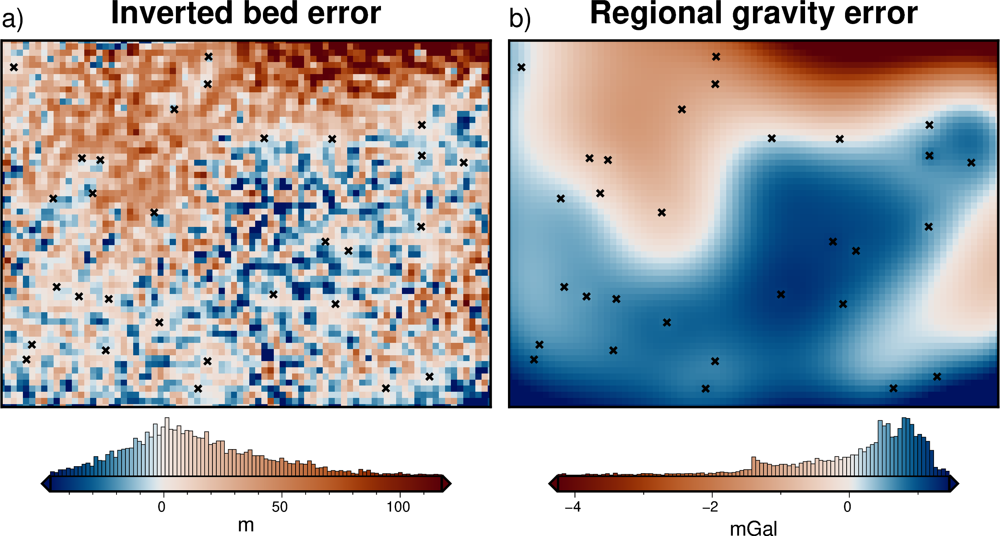

In [81]:
# # inverted bed error
ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

final_bed = final_bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
true_bed = layer1.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
bed_dif = true_bed - final_bed

# regional separation error
ds = (
    df_anomalies_noise[df_anomalies_noise.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
true_reg = ds.Surface2
reg_dif = true_reg - ds.reg
reg_dif -= np.nanmean(reg_dif)

fig = maps.plot_grd(
    bed_dif,
    fig_height=8,
    title="Inverted bed error",
    hist=True,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
    points_pen="1.5p",
    cmap="vik+h0",
    cbar_label="m",
    cbar_yoffset=1.5,
    robust=True,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j0c/.3",
    no_clip=True,
)
fig = maps.plot_grd(
    reg_dif,
    title="Regional gravity error",
    cmap=f"vik+h0",
    reverse_cpt=True,
    fig=fig,
    hist=True,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
    points_pen="1.5p",
    origin_shift="xshift",
    cbar_label="mGal",
    cbar_yoffset=1.5,
    robust=True,
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j0c/.3",
    no_clip=True,
)
fig.show()

## Sampled grav, no noise

[I 2023-05-06 15:59:21,239] A new study created in Journal with name: ../tmp_outputs/tmp184


  0%|          | 0/100 [00:00<?, ?it/s]

Best params: {'damping': 0.0007340446399223752, 'depth': 9851.220504003937}
Best trial: 21
Best score: 0.9991550639108363


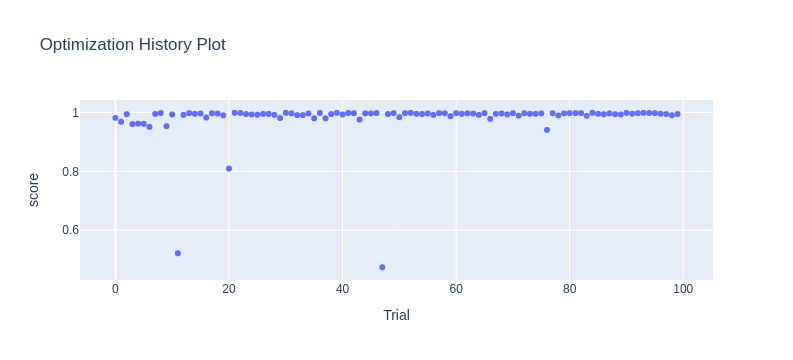

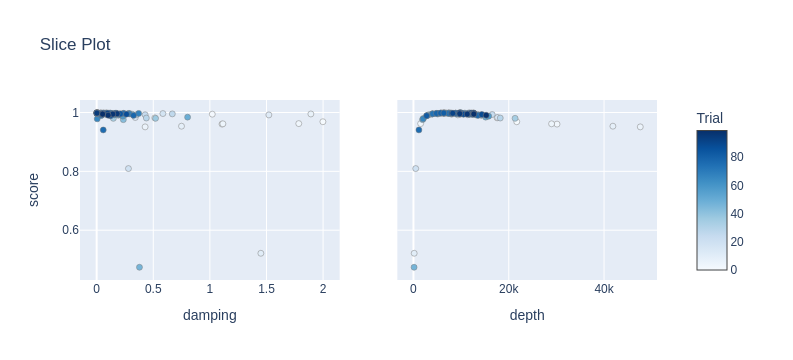

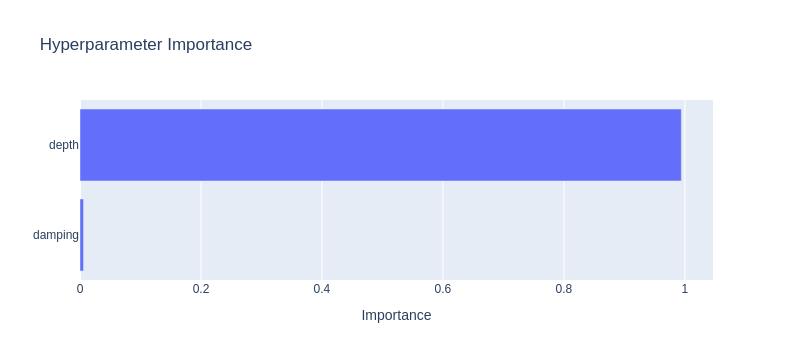

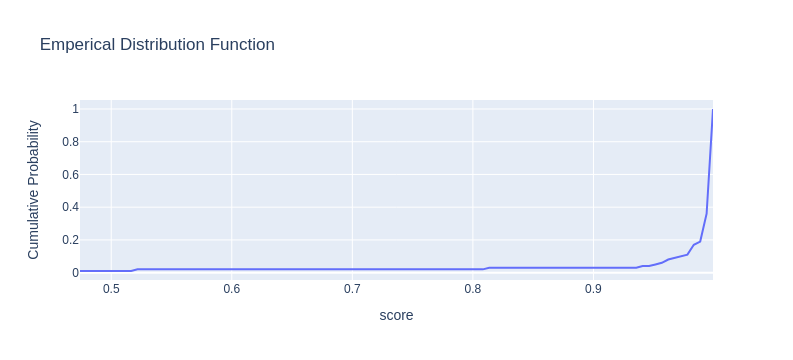

14540
4941


,northing,easting,test,Gobs,upward,layer1_forward
0,0.0,0.0,False,3.300579,1000.0,7.336436
1,0.0,500.0,True,3.210244,1000.0,7.196777
2,0.0,1000.0,False,3.104988,1000.0,7.053205
3,0.0,1500.0,True,2.986762,1000.0,6.907357
4,0.0,2000.0,False,2.857834,1000.0,6.760484
...,...,...,...,...,...,...
19476,60000.0,78000.0,False,9.207908,1000.0,0.539365
19477,60000.0,78500.0,True,9.136949,1000.0,0.610158
19478,60000.0,79000.0,False,9.057009,1000.0,0.680730
19479,60000.0,79500.0,True,8.967818,1000.0,0.750859


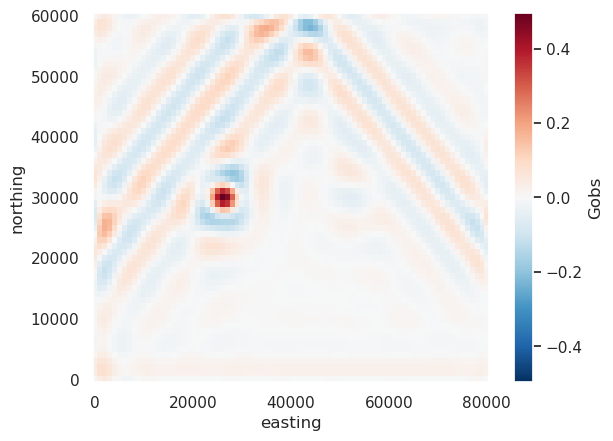

In [56]:
# parameter values, if using grid search
# num = 20
# dampings = list(np.logspace(-6, 2, num=num-1))
# dampings.append(None)
# depths = np.linspace(1, 50e3, num)

# parameter ranges, if using optimization
dampings = [10**-5, 2]
depths = [1, 50e3]

# set new spatial resolution of training points
sampled_spacing = 4e3

# sample gravity at low resolution grid, regrid at full res with eq sources
sampled_grav, score = inv_utils.resample_gravity_with_test_points(
    grav_df=full_res_grav,
    grav_column="Gobs",
    coord_columns=["easting", "northing", "upward"],
    starting_training_spacing=layer_spacing,
    coarse_training_spacing=sampled_spacing,
    region=inversion_region,
    dampings=dampings,
    depths=depths,
    # optimization = False,
    optimization=True,
    n_trials=100,
    plot=True,
    log_fname="../tmp_outputs/tmp",
)
print(len(sampled_grav[sampled_grav.test]))
print(len(sampled_grav[sampled_grav.test == False]))

# add layer1 starting forward grav into df
sampled_grav["layer1_forward"] = full_res_grav.layer1_forward

sampled_grav

DC shifted observed gravity by -1.91mGal to match forward gravity.
Highest score: 0.986934493154257
Best damping: 5.4555947811685146e-08
Best mindist: 526.7894736842105


,northing,easting,test,Gobs,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,False,3.300579,1000.0,7.336436,5.208972,-2.127463,-2.120778,-0.006685
1,0.0,500.0,True,3.210244,1000.0,7.196777,5.118638,-2.078139,-2.138031,0.059892
2,0.0,1000.0,False,3.104988,1000.0,7.053205,5.013382,-2.039823,-2.155654,0.115831
3,0.0,1500.0,True,2.986762,1000.0,6.907357,4.895156,-2.012201,-2.174195,0.161994
4,0.0,2000.0,False,2.857834,1000.0,6.760484,4.766228,-1.994256,-2.193485,0.199229
...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,False,9.207908,1000.0,0.539365,11.116301,10.576937,12.225729,-1.648792
19477,60000.0,78500.0,True,9.136949,1000.0,0.610158,11.045342,10.435184,12.174740,-1.739556
19478,60000.0,79000.0,False,9.057009,1000.0,0.680730,10.965402,10.284672,12.122210,-1.837537
19479,60000.0,79500.0,True,8.967818,1000.0,0.750859,10.876212,10.125353,12.067798,-1.942445


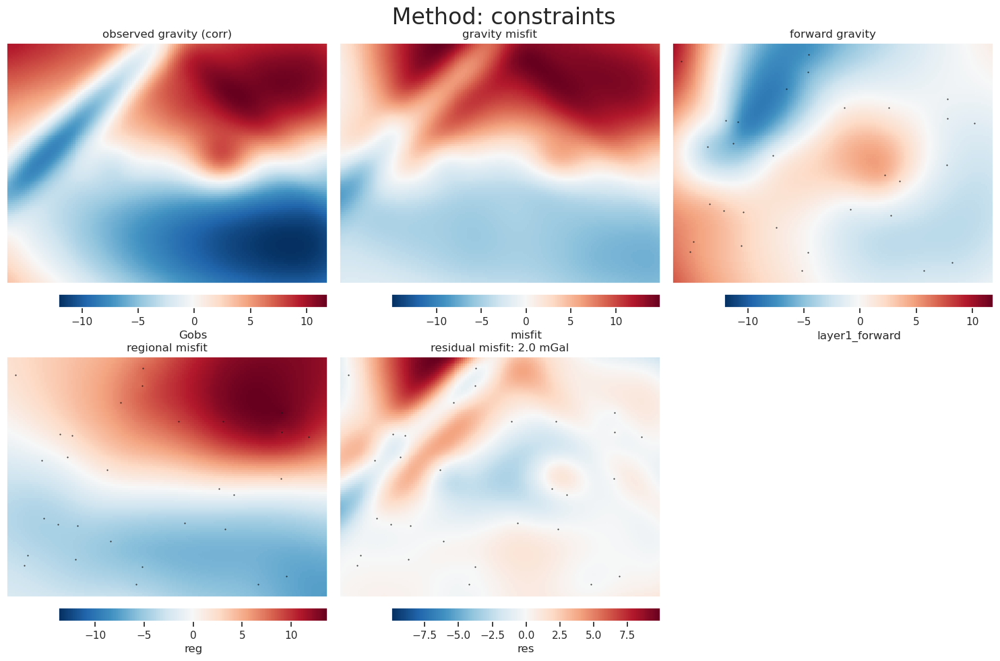

In [57]:
# resample to desired spacing
# sampled_spacing = 4e3
# sampled_grav = inv_utils.resample_with_test_points(
#     sampled_spacing,
#     full_res_grav,
#     inversion_region,
# )
regional_kwargs = dict(
    input_grav=sampled_grav,
    input_forward_column="layer1_forward",
    input_grav_column="Gobs",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
    constraints=constraints,
    grid_method="verde",
    # dampings=np.logspace(-8, -6, num=20),
    dampings=np.logspace(-9, -6, num=20),
    constraint_block_size=grav_spacing,
    block_size=grav_spacing,
)

regional_method = "constraints"

df_anomalies_sampled = regional.regional_seperation(
    regional_method=regional_method,
    **regional_kwargs,
)

anom_grids = plotting.anomalies_plotting(
    df_anomalies_sampled,
    title=f" Method: {regional_method}",
    constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
    input_forward_column="layer1_forward",
    input_grav_column="Gobs",
    # plot_type="pygmt",
    plot_type="xarray",
    robust=False,
)

df_anomalies_sampled

### Save and load results

In [58]:
df_anomalies_sampled.to_csv(
    "../synthetic_data/simple_regional_sampled_gravity_anomalies.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [82]:
df_anomalies_sampled = pd.read_csv(
    "../synthetic_data/simple_regional_sampled_gravity_anomalies.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_anomalies_sampled

,northing,easting,test,Gobs,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,False,3.300579,1000.0,7.336436,5.208972,-2.127463,-2.120778,-0.006685
1,0.0,500.0,True,3.210244,1000.0,7.196777,5.118638,-2.078139,-2.138031,0.059892
2,0.0,1000.0,False,3.104988,1000.0,7.053205,5.013382,-2.039823,-2.155654,0.115831
3,0.0,1500.0,True,2.986762,1000.0,6.907357,4.895156,-2.012201,-2.174195,0.161994
4,0.0,2000.0,False,2.857834,1000.0,6.760484,4.766228,-1.994256,-2.193485,0.199229
...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,False,9.207908,1000.0,0.539365,11.116301,10.576937,12.225729,-1.648792
19477,60000.0,78500.0,True,9.136949,1000.0,0.610158,11.045342,10.435184,12.174740,-1.739556
19478,60000.0,79000.0,False,9.057009,1000.0,0.680730,10.965402,10.284672,12.122210,-1.837537
19479,60000.0,79500.0,True,8.967818,1000.0,0.750859,10.876212,10.125353,12.067798,-1.942445


In [28]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     solver_damping =  10**-2,
#     plot_convergence=True,
# )

# # with inv_utils.HiddenPrints():
# results = inv.inversion_RMSE(
#     input_grav=df_anomalies_sampled[df_anomalies_sampled.test==False],
#     inversion_region=inversion_region,
#     true_surface = layer1,
#     constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     plot=True,
#     plot_type="xarray",
#     # robust=True,
#     **kwargs,
# )

# (
#     rmse,
#     prism_results,
#     grav_results,
#     params,
#     elapsed_time,
#     constraints_rmse,
# ) = results

# _ = plotting.plot_inversion_results(
#         grav_results,
#         prism_results,
#         params,
#         grav_region=inversion_region,
#         plot_iter_results=True,
#         plot_topo_results=True,
#         plot_grav_results=True,
#         iters_to_plot=4,
#         grav_spacing=grav_spacing,
#         constraints=constraints,
#     )

# print(f"RMSE: {rmse}")
# print(f"constraints RMSE: {constraints_rmse}")

### Optimize only for damping

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]
Best score: 0.02383802230794352
Best damping: 0.004641588833612777


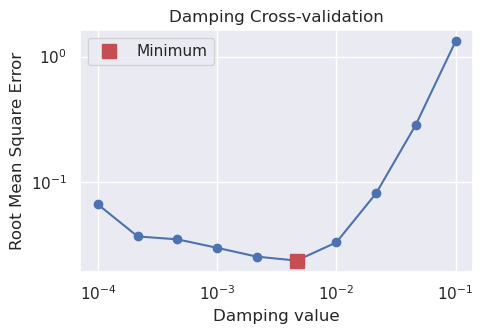

In [83]:
starting_prisms = copy.deepcopy(layer1_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    # region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../synthetic_data/synthetic_simple_regional_sampled_damping_CV"

dampings = np.logspace(-4, -1, 10)
print(f"Damping values: {dampings}")

# scores, rmses = inv.inversion_optimal_parameters(
#     training_data= df_anomalies_sampled[df_anomalies_sampled.test==False],
#     testing_data = df_anomalies_sampled[df_anomalies_sampled.test==True],
#     parameter_values = dampings,
#     function = inv.inversion_damping_MSE,
#     plot = False,
#     plot_grids = False,
#     results_fname=fname,
#     progressbar=True,
#     true_surface=layer1,
#     inversion_region=inversion_region,
#     **kwargs,
# )

# # put scores and damping values into dict
# CV_results = dict(
#     scores=scores, dampings=dampings, rmses=rmses)

# # remove if exists
# pathlib.Path(fname).unlink(missing_ok=True)

# # save scores and dampings to pickle
# with open(f"{fname}.pickle", 'wb') as f:
#     pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)

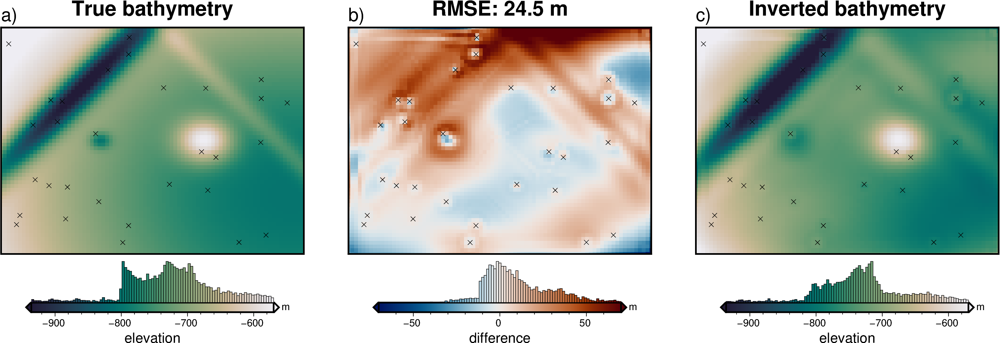

RMSE: 24.52938852723689
constraints RMSE: 2.13


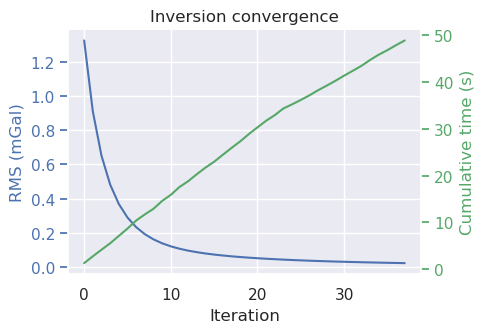

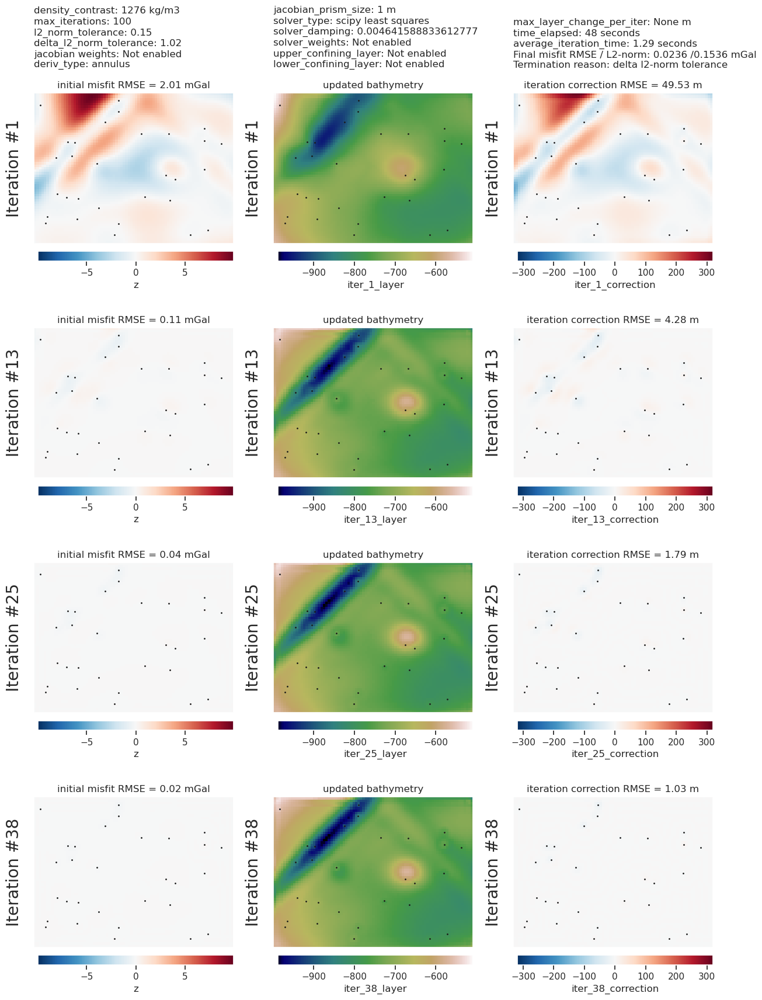

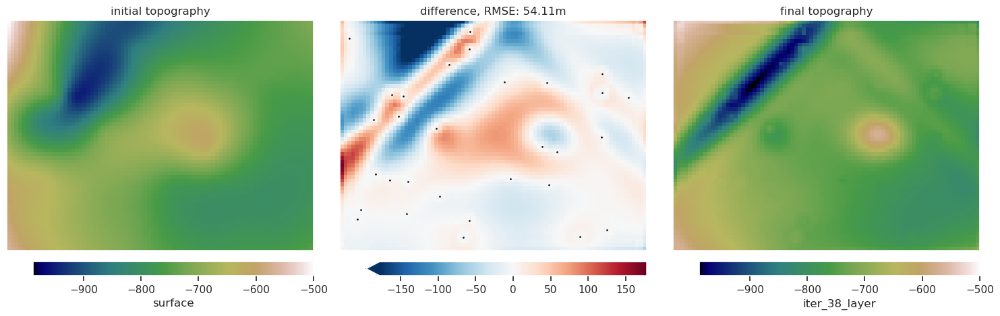

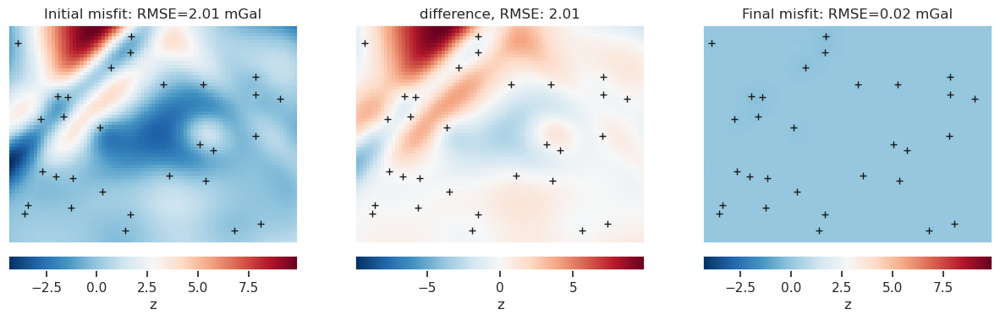

In [63]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_anomalies_sampled[df_anomalies_sampled.test == False],
        inversion_region=inversion_region,
        true_surface=layer1,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j0c/.2c",
        # title_font = "16p,Helvetica-Bold,black",
        robust=True,
        **kwargs,
    )

plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints,
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

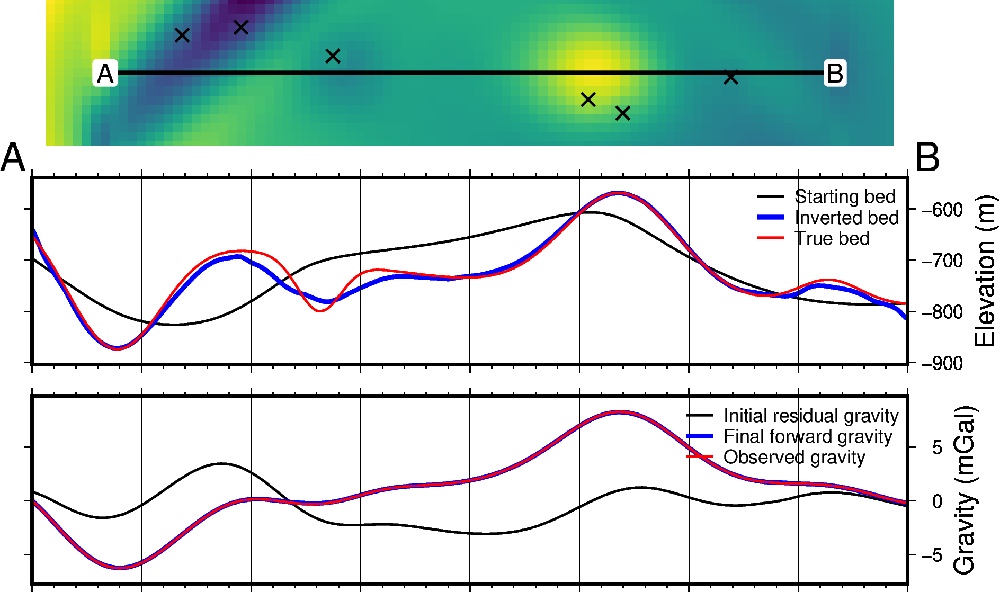

In [64]:
plotting.plot_inversion_results_profile(
    inv_result[1],
    inv_result[2],
    input_forward_column="layer1_forward",
    constraints=constraints,
    true_surface=layer1,
    start=[inversion_region[0], 30e3],
    stop=[inversion_region[1], 30e3],
    map_buffer=0.1,
    subplot_orientation="vertical",
    data_legend_loc="jTR+o0c",
    layers_legend_loc="jTR+o0c",
    layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
    data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
)

In [86]:
df_anomalies_sampled

,northing,easting,test,Gobs,upward,layer1_forward,Gobs_shift,misfit,reg,res
0,0.0,0.0,False,3.300579,1000.0,7.336436,5.208972,-2.127463,-2.120778,-0.006685
1,0.0,500.0,True,3.210244,1000.0,7.196777,5.118638,-2.078139,-2.138031,0.059892
2,0.0,1000.0,False,3.104988,1000.0,7.053205,5.013382,-2.039823,-2.155654,0.115831
3,0.0,1500.0,True,2.986762,1000.0,6.907357,4.895156,-2.012201,-2.174195,0.161994
4,0.0,2000.0,False,2.857834,1000.0,6.760484,4.766228,-1.994256,-2.193485,0.199229
...,...,...,...,...,...,...,...,...,...,...
19476,60000.0,78000.0,False,9.207908,1000.0,0.539365,11.116301,10.576937,12.225729,-1.648792
19477,60000.0,78500.0,True,9.136949,1000.0,0.610158,11.045342,10.435184,12.174740,-1.739556
19478,60000.0,79000.0,False,9.057009,1000.0,0.680730,10.965402,10.284672,12.122210,-1.837537
19479,60000.0,79500.0,True,8.967818,1000.0,0.750859,10.876212,10.125353,12.067798,-1.942445


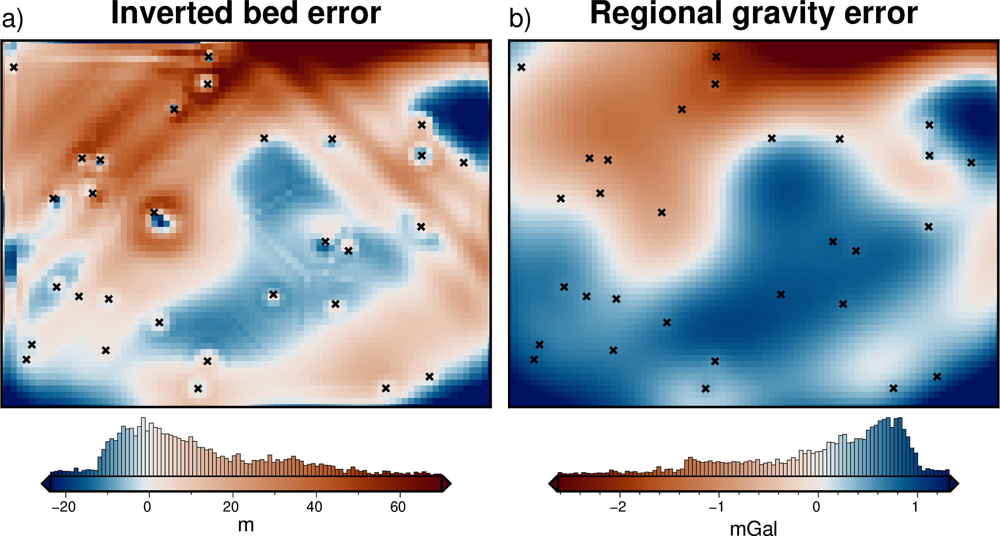

In [87]:
# # inverted bed error
ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

final_bed = final_bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
true_bed = layer1.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
bed_dif = true_bed - final_bed

# regional separation error
ds = (
    df_anomalies[df_anomalies.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
true_reg = ds.Surface2

ds = (
    df_anomalies_sampled[df_anomalies_sampled.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
reg_dif = true_reg - ds.reg
reg_dif -= np.nanmean(reg_dif)

fig = maps.plot_grd(
    bed_dif,
    fig_height=8,
    title="Inverted bed error",
    hist=True,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
    points_pen="1.5p",
    cmap="vik+h0",
    cbar_label="m",
    cbar_yoffset=1.5,
    robust=True,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j0c/.3",
    no_clip=True,
)
fig = maps.plot_grd(
    reg_dif,
    title="Regional gravity error",
    cmap=f"vik+h0",
    reverse_cpt=True,
    fig=fig,
    hist=True,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
    points_pen="1.5p",
    origin_shift="xshift",
    cbar_label="mGal",
    cbar_yoffset=1.5,
    robust=True,
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j0c/.3",
    no_clip=True,
)
fig.show()

# Optimize on damping for ensemble of noise levels and cell sizes

In [16]:
# regional_kwargs = dict(
#     input_forward_column="layer1_forward",
#     input_grav_column="Gobs",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     constraints=constraints,
#     regional_method = "constraints",
#     tension_factor = .25,
#     grid_method="verde",
#     dampings=np.logspace(-10, -5, num=20),
#     constraint_block_size=grav_spacing,
#     block_size= grav_spacing,
# )

# # noise_levels = [0,  .09] # decimal percent gaussian noise
# # cell_sizes = [1e3, 10e3] # cell size to resample gravity data at
# noise_levels = [0, .01, .02, .03, .04, .05, .06, .07, .08, .09] # decimal percent gaussian noise
# cell_sizes = [1e3, 2e3, 3e3, 4e3, 5e3, 6e3, 7e3, 8e3, 9e3, 10e3,] # cell size to resample gravity data at

# param_coords = []
# eq_scores = []
# anom_dfs = []
# for (n,c) in product(noise_levels, cell_sizes, desc="Noise/Cell Size"):
#     param_coords.append([n,c])

#     # sample gravity at low resolution grid, regrid at full res with eq sources
#     if c == layer_spacing:
#         sampled_grav = full_res_grav.copy()
#         eq_score = 1
#     else:
#         # parameter values, if using grid search
#         # num = 20
#         # dampings = list(np.logspace(-6, 2, num=num-1))
#         # dampings.append(None)
#         # depths = np.linspace(1, 50e3, num)

#         #parameter ranges, if using optimization
#         dampings = [10**-5, 2]
#         depths = [1, 50e3]

#         sampled_grav, eq_score = inv_utils.resample_gravity_with_test_points(
#             grav_df = full_res_grav,
#             grav_column = "Gobs",
#             coord_columns = ["easting", "northing", "upward"],
#             starting_training_spacing = layer_spacing,
#             coarse_training_spacing = c,
#             region = inversion_region,
#             dampings = dampings,
#             depths = depths,
#             optimization = True,
#             # optimization = False,
#             n_trials = 100,
#             plot=False,
#             log_fname = "../tmp_outputs/tmp",
#         )
#         # add layer1 starting forward grav into df
#         sampled_grav["layer1_forward"] = full_res_grav.layer1_forward

#     # add noise to data
#     sampled_grav["Gobs"] = synthetic.contaminate(
#         sampled_grav.Gobs,
#         stddev=n,
#         percent=True,
#         seed=0,
#     )

#     # seperate the regional
#     with inv_utils.HiddenPrints():
#         df = regional.regional_seperation(
#             input_grav=sampled_grav,
#             **regional_kwargs,
#         )

#     eq_scores.append(eq_score)
#     anom_dfs.append(df)

# ensemble_fname = "../synthetic_data/synthetic_simple_regional_ensemble"

# # save results to pickle dataframes
# with open(f"{ensemble_fname}_anomalies.pickle", 'wb') as fout:
#     pickle.dump(anom_dfs, fout)
# with open(f"{ensemble_fname}_noise_cellsize.pickle", 'wb') as fout:
#     pickle.dump(param_coords, fout)
# with open(f"{ensemble_fname}_eq_scores.pickle", 'wb') as fout:
#     pickle.dump(eq_scores, fout)

In [17]:
ensemble_fname = "../synthetic_data/synthetic_simple_regional_ensemble"

with open(f"{ensemble_fname}_anomalies.pickle", "rb") as f:
    anom_dfs = pickle.load(f)
with open(f"{ensemble_fname}_noise_cellsize.pickle", "rb") as f:
    param_coords = pickle.load(f)
with open(f"{ensemble_fname}_eq_scores.pickle", "rb") as f:
    eq_scores = pickle.load(f)

print(len(anom_dfs))
print(len(param_coords))

100
100


## With optuna

In [16]:
# starting_prisms = copy.deepcopy(layer1_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     # region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# inversion_kwargs = dict(
#     input_grav_column="Gobs_shift",
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     inversion_region = inversion_region,
# )

# # set number of CV runs for each method
# n_trials = 2

# ensemble_fname = "../synthetic_data/synthetic_simple_regional_ensemble"

# for i, df in enumerate(tqdm(anom_dfs)):
#     # set name and storage for the optimization
#     study_name = f"{ensemble_fname}_noise_{param_coords[i][0]}_cellsize_{param_coords[i][1]}"
#     fname = f"../optimization_logs/{study_name}.log"
#     results_fname = f"../synthetic_data/{study_name}"

#     # remove if exists
#     for p in pathlib.Path(".").glob(f"{fname}*"):
#         pathlib.Path(p).unlink(missing_ok=True)

#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # create study
#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="BoTorch")
#         study = optuna.create_study(
#             study_name=study_name,
#             storage=storage,
#             direction="minimize",
#             sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#             load_if_exists=True,
#         )
#     # define the objective function
#     objective_func = optimization.CV_inversion(
#         training_data = df[df.test==False],
#         testing_data = df[df.test==True],
#         fname = results_fname,
#         starting_prisms = starting_prisms,
#         true_surface = layer1,
#         damping_limits = [-4, -1],  # damping = 10^damping_limit
#         damping_step = .1,
#         **inversion_kwargs,
#     )
#     # run the optimization
#     study, study_df = optimization.optuna_parallel(
#         study_name=study_name,
#         study_storage=storage,
#         objective = objective_func,
#         n_trials=n_trials,
#         maximize_cpus=True,
#         parallel=True,
#     )

In [17]:
# inversion_results = []
# resulting_dampings = []
# resulting_l2_norms = []
# resulting_scores = []
# resulting_rmses = []

# ensemble_fname = "../synthetic_data/synthetic_simple_regional_ensemble"

# for i, df in enumerate(anom_dfs):
#     # set name and storage for the optimization
#     study_name = f"{ensemble_fname}_noise_{param_coords[i][0]}_cellsize_{param_coords[i][1]}"
#     fname = f"../optimization_logs/{study_name}.log"
#     results_fname = f"../synthetic_data/{study_name}"


#     with warnings.catch_warnings():
#         warnings.filterwarnings("ignore", message="JournalStorage is experimental")
#         storage = JournalStorage(JournalFileStorage(fname))

#     # load past study
#     study = optuna.load_study(
#         study_name=study_name,
#         storage=storage,
#     )

#     # load best inversion's results
#     # print(study.best_params)
#     # print(study.best_trial)
#     with open(f"{results_fname}_trial_{study.best_trial.number}_results.pickle", 'rb') as f:
#         results = pickle.load(f)

#     inversion_results.append(results)

#     # get best parameters
#     best_score = study.best_trial.value
#     best_rmse =  study.best_trial.user_attrs["true_surface_RMSE"]
#     best_damping = study.best_trial.params["damping"]

#     resulting_dampings.append(best_damping)
#     resulting_scores.append(best_score)
#     resulting_rmses.append(best_rmse)


# df = pd.DataFrame({
#     "noise": [x[0] for x in param_coords],
#     "cell_size": [x[1] for x in param_coords],
#     "Score": resulting_scores,
#     "RMSE": resulting_rmses,
#     "Damping": [10**x for x in resulting_dampings],
# })
# # df.to_csv(
# #     f"{ensemble_fname}.csv.gz",
# #     sep=",",
# #     na_rep="",
# #     header=True,
# #     index=False,
# #     encoding="utf-8",
# #     compression="gzip",
# # )
# df

## Without optuna

In [18]:
starting_prisms = copy.deepcopy(layer1_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    # region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
inversion_kwargs = dict(
    input_grav_column="Gobs_shift",
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    prism_layer=starting_prisms,
)

dampings = np.logspace(-4, -1, 10)
# dampings = [10**-1.2, 10**-1]
print(f"Damping values: {dampings}")

ensemble_fname = "../synthetic_data/synthetic_simple_regional_damping_CV_ensemble"

inversion_results = []
resulting_scores = []
resulting_dampings = []
resulting_rmses = []
for i, df in enumerate(tqdm(anom_dfs)):
    noise = param_coords[i][0]
    cellsize = param_coords[i][1]

    # set name and storage for the optimization
    set_fname = f"{ensemble_fname}_noise_{noise}_cellsize_{cellsize}"

    #     with inv_utils.HiddenPrints():
    #         CV_scores, rmses = inv.inversion_optimal_parameters(
    #             training_data= df[df.test==False],
    #             testing_data = df[df.test==True],
    #             parameter_values = dampings,
    #             function = inv.inversion_damping_MSE,
    #             inversion_region = inversion_region,
    #             true_surface = layer1,
    #             plot = False,
    #             plot_grids = False,
    #             results_fname = set_fname,
    #             progressbar = False,
    #             **inversion_kwargs,
    #         )

    #     # put all scores and damping values into dict
    #     CV_results = dict(CV_scores=CV_scores, dampings=dampings, rmses=rmses)

    #     # remove if exists
    #     pathlib.Path(f"{set_fname}.pickle").unlink(missing_ok=True)

    #     # save scores and dampings of each set to pickle
    #     with open(f"{set_fname}.pickle", 'wb') as f:
    #         pickle.dump(CV_results, f)

    # load best inversion results of each set of noise/sampling
    with open(f"{set_fname}.pickle", "rb") as f:
        CV_results = pickle.load(f)

    # get best parameters of each set
    best = np.argmin(CV_results["CV_scores"])
    best_score = CV_results["CV_scores"][best]
    best_rmse = CV_results["rmses"][best]
    best_damping = CV_results["dampings"][best]

    # get best inversion result of each set
    with open(f"{set_fname}_trial_{best}.pickle", "rb") as f:
        inv_result = pickle.load(f)

    inversion_results.append(inv_result)
    resulting_dampings.append(best_damping)
    resulting_scores.append(best_score)
    resulting_rmses.append(best_rmse)

# df = pd.DataFrame({
#     "noise": [x[0] for x in param_coords[0:len(resulting_scores)]],
#     "cell_size": [x[1] for x in param_coords[0:len(resulting_scores)]],
#     "Score": resulting_scores,
#     "RMSE": resulting_rmses,
#     "Damping": resulting_dampings,
#     "Eq source score": eq_scores,
# })
# df.to_csv(
#     f"{ensemble_fname}.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )
# df

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]


  0%|          | 0/100 [00:00<?, ?it/s]

In [8]:
ensemble_fname = "../synthetic_data/synthetic_simple_regional_damping_CV_ensemble"

df = pd.read_csv(
    f"{ensemble_fname}.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df.sort_values(by="Score")

,noise,cell_size,Score,RMSE,Damping,Eq source score
9,0.00,10000.0,0.018536,73.686324,0.010000,0.909144
8,0.00,9000.0,0.021732,60.081644,0.002154,0.916432
5,0.00,6000.0,0.021885,35.514681,0.001000,0.986857
3,0.00,4000.0,0.021895,33.407957,0.004642,0.998893
4,0.00,5000.0,0.021949,34.028396,0.004642,0.994556
...,...,...,...,...,...,...
90,0.09,1000.0,1.145168,60.477825,0.010000,1.000000
99,0.09,10000.0,1.145313,74.672231,0.010000,0.909163
97,0.09,8000.0,1.147297,67.612460,0.021544,0.944562
95,0.09,6000.0,1.150020,66.650132,0.010000,0.977385


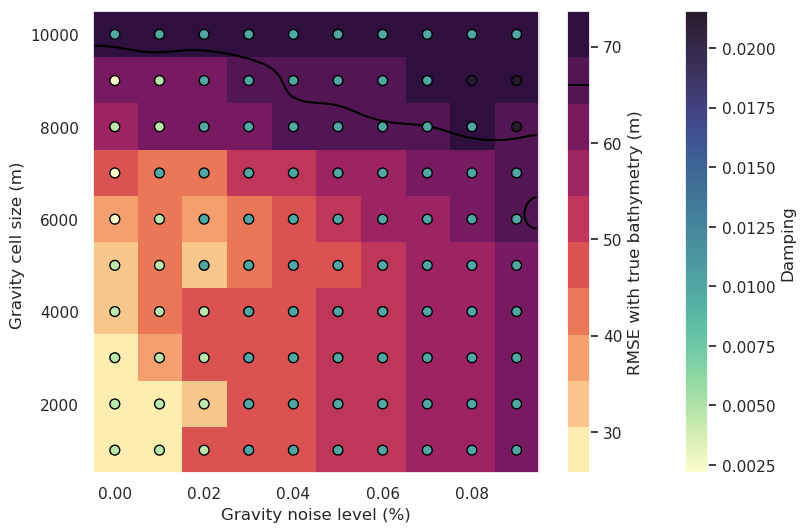

In [9]:
fig = plotting.plot_noise_cellsize_ensemble(
    df,
    background="RMSE",
    background_title="RMSE with true bathymetry (m)",
    # background="Score",
    # background_title="Gravity CV score",
    # background="Damping",
    # background_title="Damping",
    # background="Eq source score",
    # background_title="Eq source score",
    # background_color_log = True,
    background_robust=True,
    # points_color=df.RMSE,
    points_color=df.Damping,
    # points_color=df["Eq source score"],
    # points_color=df.Score,
    # points_size=df.RMSE,
    # points_size=df.Score,
    # points_scaling=80,
    # points_color_log=True,
    points_robust=True,
    plot_contours=[66],
)

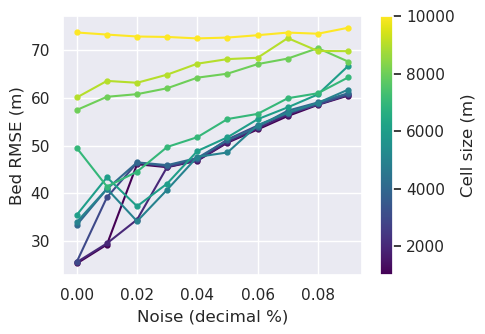

In [88]:
plotting.plot_ensemble_as_lines(
    df,
    x_col="noise",
    groupby_col="cell_size",
    x_label="Noise (decimal %)",
    cbar_label="Cell size (m)",
)

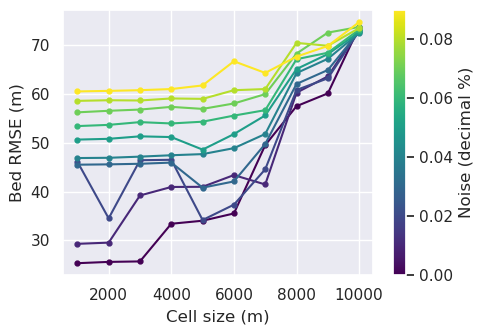

In [89]:
plotting.plot_ensemble_as_lines(
    df,
    x_col="cell_size",
    groupby_col="noise",
    x_label="Cell size (m)",
    cbar_label="Noise (decimal %)",
)

In [23]:
# # load best inversion results of each set of noise/sampling
# with open(f"{set_fname}_trial_{0}.pickle", 'rb') as f:
#     inversion_results = pickle.load(f)
# inversion_results

In [103]:
prism_results = [x[1] for x in inversion_results[0:2]]
grav_results = [x[2] for x in inversion_results[0:2]]

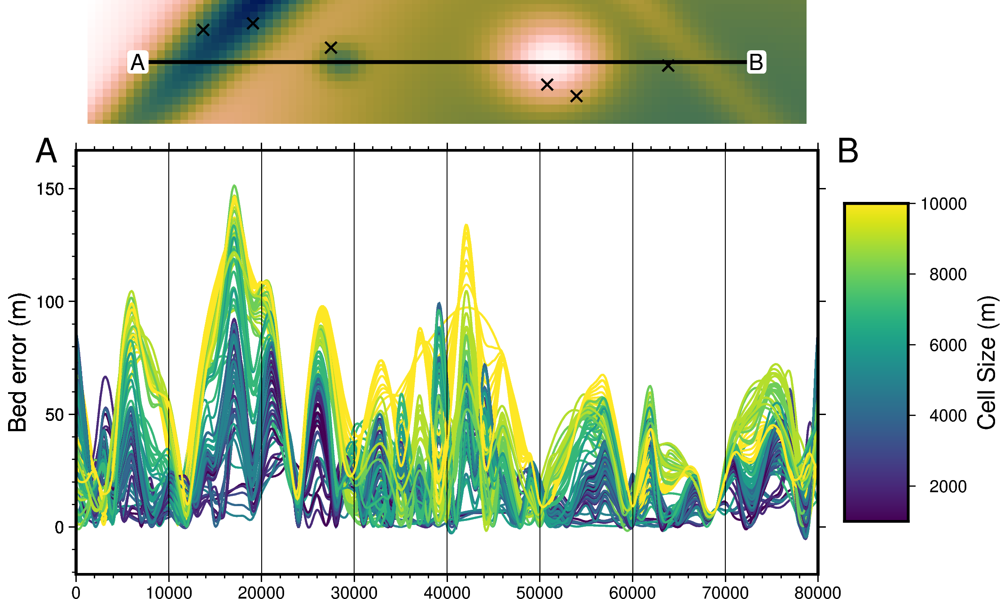

In [131]:
prism_results = [x[1] for x in inversion_results]  # [0:2]]
grav_results = [x[2] for x in inversion_results]  # [0:2]]

plotting.plot_inversion_ensemble_results_profile(
    prism_results,
    grav_results,
    input_forward_column="layer1_forward",
    name_prefixes=[i for i, j in enumerate(grav_results)],
    constraints=constraints,
    true_surface=layer1,
    true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
    start=[inversion_region[0], 30e3],
    stop=[inversion_region[1], 30e3],
    map_buffer=0.1,
    layers_legend_loc="jBR",
    layers_legend=False,
    layers_line_cmap="viridis",
    layers_color=df.cell_size.values,
    layers_line_cmap_label="Cell Size (m)",
    layers_frame=["nesW", "xafg", "ya+lBed error (m)"],
    # data_legend_loc="jTR",
    # data_legend = False,
    # data_line_cmap = "matter",
    # data_color = df.cell_size.values,
    # data_line_cmap_label="Cell Size",
    # data_frame = ["neSW","xafg", "ya+lRegional error (mGal)"],
    plot_regional_error=False,
    absolute_bed_error=True,
)

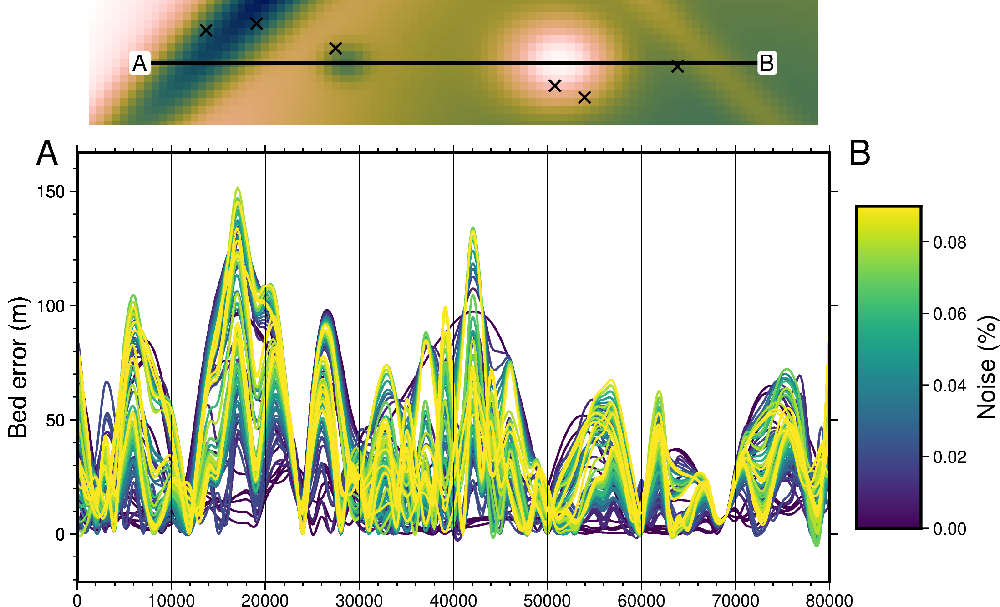

In [132]:
prism_results = [x[1] for x in inversion_results]  # [0:2]]
grav_results = [x[2] for x in inversion_results]  # [0:2]]

plotting.plot_inversion_ensemble_results_profile(
    prism_results,
    grav_results,
    input_forward_column="layer1_forward",
    name_prefixes=[i for i, j in enumerate(grav_results)],
    constraints=constraints,
    true_surface=layer1,
    true_regional=full_res_grav.set_index(["northing", "easting"]).to_xarray().Surface2,
    start=[inversion_region[0], 30e3],
    stop=[inversion_region[1], 30e3],
    map_buffer=0.1,
    layers_legend_loc="jBR",
    layers_legend=False,
    layers_line_cmap="viridis",
    layers_color=df.noise.values,
    layers_line_cmap_label="Noise (%)",
    layers_frame=["nesW", "xafg", "ya+lBed error (m)"],
    # data_legend_loc="jTR",
    # data_legend = False,
    # data_line_cmap = "matter",
    # data_color = df.cell_size.values,
    # data_line_cmap_label="Cell Size",
    # data_frame = ["neSW","xafg", "ya+lRegional error (mGal)"],
    plot_regional_error=False,
    absolute_bed_error=True,
)

## Compare ensembles with and without regional

In [7]:
ensemble_fname_no_reg = "../synthetic_data/synthetic_simple_damping_CV_ensemble"

df_no_reg = pd.read_csv(
    f"{ensemble_fname_no_reg}.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_no_reg.sort_values(by="Score")

,noise,cell_size,Score,RMSE,Damping,Eq source score
3,0.00,4000.0,0.020552,8.816456,0.010000,0.995189
0,0.00,1000.0,0.020735,7.522940,0.004642,1.000000
2,0.00,3000.0,0.020752,7.930108,0.002154,0.994440
5,0.00,6000.0,0.021107,10.477143,0.010000,0.926351
1,0.00,2000.0,0.021138,8.214722,0.010000,0.999923
...,...,...,...,...,...,...
93,0.09,4000.0,0.788672,27.347540,0.010000,0.994898
92,0.09,3000.0,0.788793,27.214156,0.010000,0.999341
90,0.09,1000.0,0.788822,27.208306,0.010000,1.000000
89,0.08,10000.0,0.873415,49.511011,0.010000,0.610270


[<Figure size 900x600 with 3 Axes>, <Figure size 900x600 with 3 Axes>]

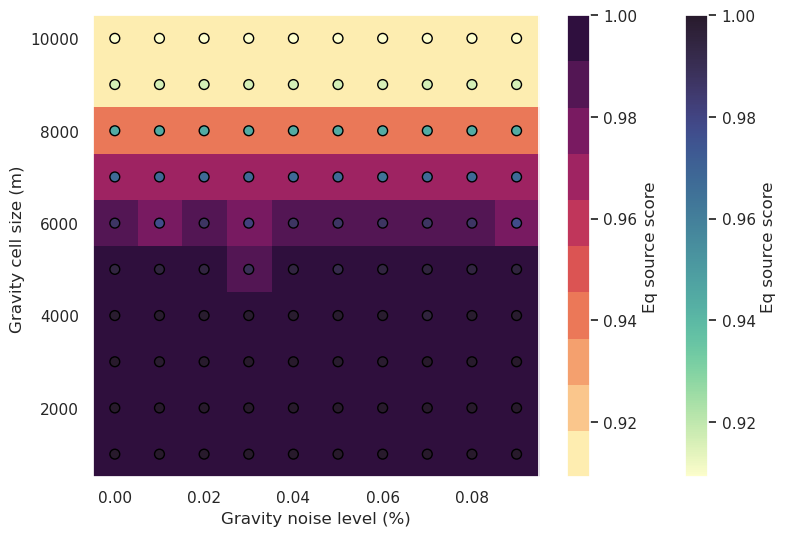

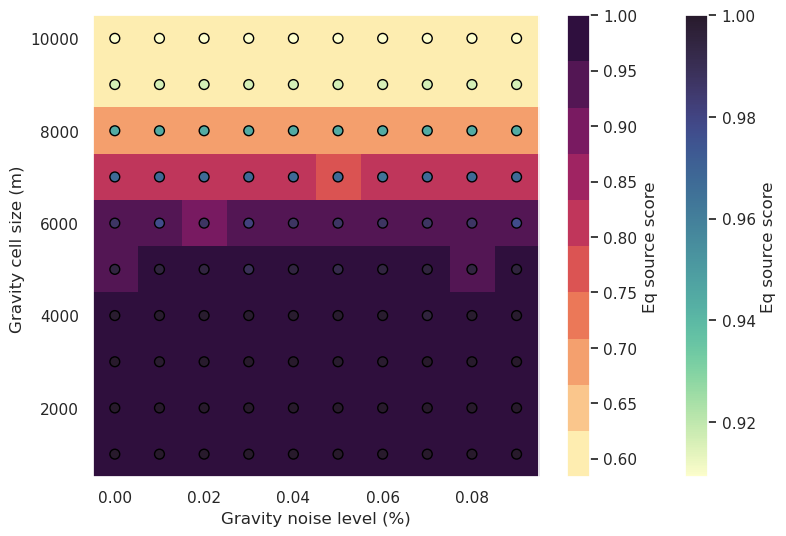

In [99]:
figs = []
for d in [df, df_no_reg]:
    fig = plotting.plot_noise_cellsize_ensemble(
        d,
        # background="RMSE",
        # background_title="RMSE with true bathymetry (m)",
        # background="Score",
        # background_title="Gravity CV score",
        # background="Damping",
        # background_title="Damping",
        background="Eq source score",
        background_title="Eq source score",
        # background_color_log = True,
        background_robust=True,
        # points_color=df.RMSE,
        # points_color=df.Damping,
        points_color=df["Eq source score"],
        # points_color=df.Score,
        # points_size=df.RMSE,
        # points_size=df.Score,
        # points_scaling=80,
        # points_color_log=True,
        # points_robust=True,
    )
    figs.append(fig)
figs

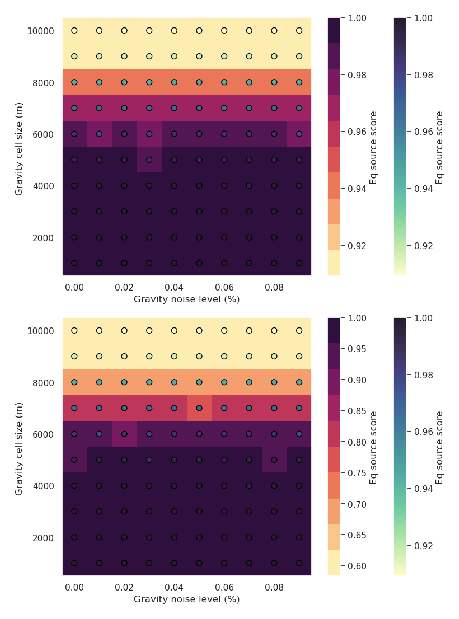

In [115]:
plotting.merge_mpl_figs(figs, axis=0, dpi=100)